# MSDS 453: Natural Language Processing Final Project
## Author: Aaliya Merchant

This project centers around creating an enhanced chatbot
interface for fans of Taylor Swift, aiming to provide personalized song recommendations based on the user’s
song preferences. The chatbot incorporates multiple filters like album, sentiment, and thematic keywords to
tailor the recommendations.

**Imports**

In [27]:
!pip install rake_nltk
!pip install fuzzywuzzy
!pip install networkx

In [28]:
# Imports
import os
import shutil
import re
from git import Repo
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
import numpy as np
import nltk
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import spacy
from collections import Counter
from nltk.corpus import stopwords
import plotly.graph_objects as go
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem import WordNetLemmatizer
from textblob import TextBlob
import pandas as pd
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.decomposition import LatentDirichletAllocation as LDA
from sklearn.cluster import KMeans
from rake_nltk import Rake
from fuzzywuzzy import process
import networkx as nx
from matplotlib.patches import Patch
import warnings

warnings.filterwarnings("ignore")

# Initialize SpaCy for NER
nlp = spacy.load('en_core_web_sm')

# Download NLTK resources
nltk.download('punkt_tab')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('vader_lexicon')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

**Load Data from GitHub repo:** https://github.com/ishijo/Taylor-Swift-Lyrics

In [29]:
# List of Taylor Swift's original 11 albums
original_11_albums = [
    "TaylorSwift", "Fearless", "SpeakNow", "Red", "1989", "Reputation",
    "Lover", "Folklore", "Evermore", "Midnights", "THETORTUREDPOETSDEPARTMENT_THEANTHOLOGY"
]

def download_files_from_github_folder(repo_url, folder_path, save_dir):
    """
    Download files from a specific folder in a GitHub repository and save them to a specified directory.

    This function clones the given GitHub repository, navigates to the specified folder within the repository,
    and copies all files from the albums listed in `original_11_albums` to a local directory.

    Parameters:
    - repo_url (str): The URL of the GitHub repository to clone.
    - folder_path (str): The path of the folder inside the repository to download files from.
    - save_dir (str): The local directory where the files will be saved.

    Returns:
    - None: This function does not return a value. It saves the files directly to the specified `save_dir`.

    Exceptions:
    - The function handles errors during the download process and prints any issues that occur (e.g., folder not found or download errors).
    """
    # Temporary directory to store the cloned repository
    repo_dir = "./temp_repo"
    try:
        # Clone the repository to a temporary directory
        Repo.clone_from(repo_url, repo_dir)

        # Construct the full path to the folder to download from
        target_folder = os.path.join(repo_dir, folder_path)

        # Create the target save directory if it doesn't exist
        os.makedirs(save_dir, exist_ok=True)

        # Check if the specified folder exists within the repository
        if not os.path.exists(target_folder):
            print(f"Folder {folder_path} does not exist in the repository.")
            return

        # Iterate through all folders in the target directory
        for album_folder in os.listdir(target_folder):
            # Check if the album folder is one of the original 10 albums
            if album_folder in original_11_albums:
                album_folder_path = os.path.join(target_folder, album_folder)

                # Ensure the folder is a directory
                if os.path.isdir(album_folder_path):
                    # Walk through the album folder recursively
                    for root, _, files in os.walk(album_folder_path):
                        for file in files:
                            # Source path of the file in the GitHub repository
                            source_path = os.path.join(root, file)

                            # Relative path of the file within the album folder
                            relative_path = os.path.relpath(source_path, album_folder_path)

                            # Destination path for saving the file locally
                            destination_path = os.path.join(save_dir, album_folder, relative_path)

                            # Create the destination directory if it doesn't exist
                            os.makedirs(os.path.dirname(destination_path), exist_ok=True)

                            # Copy the file from the source to the destination
                            shutil.copy(source_path, destination_path)
    except Exception as e:
        # Print any error that occurs during the file download process
        print(f"Error downloading files: {e}")
    finally:
        # Clean up by removing the temporary repository directory
        shutil.rmtree(repo_dir, ignore_errors=True)


In [30]:
# URL of the GitHub repo and folder path
repo_url = "https://github.com/ishijo/Taylor-Swift-Lyrics.git"  # The URL of the GitHub repository containing the files
folder_path = "data/Albums"  # Path to the folder inside the GitHub repository that contains the album data
save_dir = "./downloaded_files"  # Local directory where the files will be saved

# Download files from GitHub repo
download_files_from_github_folder(repo_url, folder_path, save_dir)


**Clean the Data**

In [31]:
def normalize_song_title(title):
    """
    Normalize song title by adding spaces and capitalizing words.

    This function processes a song title by:
    - Replacing underscores with spaces.
    - Separating camel case (e.g., 'CamelCase' becomes 'Camel Case').
    - Removing any leading or trailing whitespace.
    - Ensuring correct capitalization of words.

    Parameters:
    - title (str): The original song title.

    Returns:
    - str: The normalized song title.
    """
    # Replace underscores with spaces and separate camel case
    title = re.sub(r'([a-z])([A-Z])', r'\1 \2', title.replace('_', ' '))

    # Remove any leading/trailing whitespace
    title = title.strip()

    # Ensure correct capitalization
    return title.title()


def normalize_album_title(title):
    """
    Normalize album title by adding spaces and capitalizing words.

    This function normalizes an album title by:
    - Handling a special case for 'THETORTUREDPOETSDEPARTMENT_THEANTHOLOGY'.
    - Replacing underscores and hyphens with spaces.
    - Separating camel case (e.g., 'AlbumTitle' becomes 'Album Title').
    - Capitalizing each word in the title.

    Parameters:
    - title (str): The original album title.

    Returns:
    - str: The normalized album title.
    """
    # Hard-code the specific transformation for 'THETORTUREDPOETSDEPARTMENT_THEANTHOLOGY'
    if title == "THETORTUREDPOETSDEPARTMENT_THEANTHOLOGY":
        return "The Tortured Poets Department"

    # For other cases, proceed with normal processing
    title = re.sub(r'([a-z])([A-Z])', r'\1 \2', title)
    title = title.replace('_', ' ').replace('-', ' ')

    # Ensure correct capitalization
    return title.title()


def load_lyrics_data(save_dir):
    """
    Load lyrics data from the specified directory containing song files.

    This function reads the lyrics of songs from text files stored in album directories.
    It normalizes both song titles and album titles, then stores the data in a dictionary
    with the song title as the key. Each entry contains the song lyrics and album name.

    Parameters:
    - save_dir (str): The local directory where the album folders and song files are located.

    Returns:
    - dict: A dictionary containing song data where the key is the song title, and the value
      is another dictionary with 'lyrics' and 'album' as keys.
    """
    songs_data = {}
    for album in original_11_albums:
        # Normalize album title before processing
        normalized_album = normalize_album_title(album)
        album_folder = os.path.join(save_dir, album)

        # Iterate through the album folder to load each song file
        for song_file in os.listdir(album_folder):
            if song_file.endswith(".txt"):  # Only process text files
                song_title = song_file.replace(".txt", "")  # Extract song title from file name
                normalized_title = normalize_song_title(song_title)  # Normalize the song title
                song_path = os.path.join(album_folder, song_file)  # Full path to the song file

                # Open the song file and read its lyrics
                with open(song_path, 'r', encoding='utf-8') as file:
                    lyrics = file.read()

                # Store the song data in the dictionary
                songs_data[normalized_title] = {
                    'lyrics': lyrics,
                    'album': normalized_album,  # Use normalized album title
                    'original_title': song_title  # Store the original title of the song
                }

    return songs_data


def clean_and_lemmatize_lyrics(raw_lyrics):
    """
    Clean and lemmatize song lyrics to prepare them for analysis.

    This function performs several steps on the raw lyrics:
    - Removes content inside square brackets (e.g., references or contributor info).
    - Strips non-lyrical content such as album credits and translations.
    - Removes leading/trailing numbers and excessive newlines.
    - Handles common colloquial expressions.
    - Tokenizes the lyrics, removes stopwords, and lemmatizes each token.

    Parameters:
    - raw_lyrics (str): The raw lyrics of the song.

    Returns:
    - str: The cleaned and lemmatized lyrics as a single string.
    """
    # Pre-compile regular expressions for performance
    remove_brackets = re.compile(r"\[.*?\]")  # Remove everything in square brackets
    remove_non_lyrical = re.compile(r"(Contributors|Translations|Embed|Album|Link|Credits).*")
    remove_numbers = re.compile(r"^\d+|\d+$")  # Remove leading and trailing numbers
    remove_extra_newlines = re.compile(r"\n+")  # Remove excessive newlines
    trim_spaces = re.compile(r"^\s+|\s+?$")  # Remove leading and trailing spaces

    # Clean the lyrics
    cleaned_lyrics = remove_brackets.sub("", raw_lyrics)
    cleaned_lyrics = remove_non_lyrical.sub("", cleaned_lyrics)
    cleaned_lyrics = remove_numbers.sub("", cleaned_lyrics)
    cleaned_lyrics = remove_extra_newlines.sub("\n", cleaned_lyrics)
    cleaned_lyrics = trim_spaces.sub("", cleaned_lyrics)

    # Handle colloquial expressions (e.g., 'gonna', 'ca', 'got to')
    colloquial_replacements = {
        r"\bgon na\b": "gonna",
        r"\bca\b": "can",
        r"\bgot ta\b": "got to"
    }
    for pattern, replacement in colloquial_replacements.items():
        cleaned_lyrics = re.sub(pattern, replacement, cleaned_lyrics)

    # Tokenize and lemmatize the lyrics
    tokens = word_tokenize(cleaned_lyrics.lower())  # Tokenize and convert to lowercase
    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))  # List of English stopwords

    # Use list comprehension for filtering and lemmatizing
    lemmatized_lyrics = ' '.join([
        lemmatizer.lemmatize(word)  # Lemmatize each word
        for word in tokens
        if word.isalpha() and word not in stop_words  # Only keep alphabetic words not in stopwords
    ])

    return lemmatized_lyrics


In [32]:
songs_data = load_lyrics_data(save_dir)

### **Exploratory data analysis (EDA)**

# Album Statistics

In [33]:
def analyze_sentiment(lyrics):
    """
    Analyze sentiment of the lyrics using VADER sentiment analysis.

    This function calculates the sentiment scores of the song lyrics using the
    SentimentIntensityAnalyzer from the `vaderSentiment` library. It returns the compound
    score (overall sentiment) and the neutral score (how neutral the text is).

    Parameters:
    - lyrics (str): The cleaned and lemmatized lyrics of the song.

    Returns:
    - tuple: A tuple containing two values:
        - `compound` (float): The overall sentiment score ranging from -1 (negative) to +1 (positive).
        - `neu` (float): The neutrality score indicating the proportion of the text that is neutral.
    """
    sia = SentimentIntensityAnalyzer()
    sentiment = sia.polarity_scores(lyrics)
    return sentiment['compound'], sentiment['neu']


def compute_song_stats(lyrics):
    """
    Calculate song-level statistics for the given lyrics.

    This function computes several song statistics:
    - Word count (total number of words).
    - Unique word count (number of unique words).
    - Average word length (average length of words in the song).
    - Sentence count (total number of sentences).
    - Lexical richness (ratio of unique words to total words).

    Parameters:
    - lyrics (str): The cleaned and lemmatized lyrics of the song.

    Returns:
    - tuple: A tuple containing the following statistics:
        - `total_words` (int): The total word count.
        - `unique_words` (int): The number of unique words.
        - `avg_word_length` (float): The average length of words in the lyrics.
        - `sentence_count` (int): The number of sentences in the lyrics.
        - `lexical_richness` (float): The lexical richness of the song.
    """
    word_tokens = word_tokenize(lyrics)
    total_words = len(word_tokens)
    unique_words = len(set(word_tokens))
    avg_word_length = np.mean([len(word) for word in word_tokens]) if total_words > 0 else 0
    sentence_count = len(sent_tokenize(lyrics))
    lexical_richness = unique_words / total_words if total_words > 0 else 0
    return total_words, unique_words, avg_word_length, sentence_count, lexical_richness


def compute_album_stats(songs_data):
    """
    Calculate album-level statistics by aggregating song statistics.

    This function calculates various statistics for each album:
    - Total word count across all songs in the album.
    - Total unique words across all songs in the album.
    - Average lexical richness across all songs in the album.
    - Average song length in terms of word count.
    - The number of songs in the album.

    Parameters:
    - songs_data (dict): A dictionary containing data for all songs, including their statistics.

    Returns:
    - dict: A dictionary containing album statistics, including word count, unique word count, and more.
    """
    album_stats = {}

    for song_title, song_info in songs_data.items():
        album = song_info['album']
        stats = song_info['stats']

        if album not in album_stats:
            album_stats[album] = {
                'word_count': 0,
                'unique_words': set(),
                'lexical_richness': [],
                'song_lengths': [],
                'song_count': 0  # Initialize song count
            }

        album_stats[album]['word_count'] += stats['Word Count']
        album_stats[album]['unique_words'].update(word_tokenize(song_info['lyrics']))
        album_stats[album]['lexical_richness'].append(stats['Lexical Richness'])
        album_stats[album]['song_lengths'].append(stats['Word Count'])
        album_stats[album]['song_count'] += 1  # Increment song count

    for album, stats in album_stats.items():
        album_stats[album]['unique_words'] = len(stats['unique_words'])
        album_stats[album]['avg_song_length'] = np.mean(stats['song_lengths'])
        album_stats[album]['avg_lexical_richness'] = np.mean(stats['lexical_richness'])

    return album_stats


def process_songs_data(songs_data):
    """
    Process each song in the dataset by cleaning lyrics, analyzing sentiment, and computing song statistics.

    This function iterates through each song, performs the following:
    - Cleans and lemmatizes the lyrics using the `clean_and_lemmatize_lyrics` function.
    - Analyzes the sentiment of the cleaned lyrics using the `analyze_sentiment` function.
    - Computes various song statistics using the `compute_song_stats` function.

    Parameters:
    - songs_data (dict): A dictionary containing song data, including raw lyrics and album information.
    """
    for song_title, song_info in songs_data.items():
        raw_lyrics = song_info['lyrics']
        cleaned_lyrics = clean_and_lemmatize_lyrics(raw_lyrics)  # Clean and lemmatize lyrics
        songs_data[song_title]['lyrics'] = cleaned_lyrics

        polarity, subjectivity = analyze_sentiment(cleaned_lyrics)  # Analyze sentiment
        song_info['sentiment'] = {
            'Polarity': polarity,
            'Subjectivity': subjectivity
        }

        total_words, unique_words, avg_word_length, sentence_count, lexical_richness = compute_song_stats(cleaned_lyrics)  # Compute song-level stats
        song_info['stats'] = {
            'Word Count': total_words,
            'Unique Words': unique_words,
            'Avg Word Length': avg_word_length,
            'Sentence Count': sentence_count,
            'Lexical Richness': lexical_richness
        }


def format_album_stats(album_stats, songs_data):
    """
    Format the album statistics to improve readability and include song-level details.

    This function organizes album statistics by including a summary of song-level details, such as:
    - Word count for each song.
    - Unique words in each song.
    - Lexical richness of each song.
    - Song lengths (in terms of word count).
    - The range of lexical richness and song lengths for the album.

    Parameters:
    - album_stats (dict): A dictionary containing aggregated album statistics.
    - songs_data (dict): A dictionary containing individual song data, including statistics.

    Returns:
    - dict: A dictionary containing formatted album statistics, including detailed song information.
    """
    formatted_stats = {}

    for album, stats in album_stats.items():
        avg_song_length = round(stats['avg_song_length'], 2)
        avg_lexical_richness = round(stats['avg_lexical_richness'], 4)
        total_word_count = stats['word_count']
        total_unique_words = stats['unique_words']
        song_count = stats['song_count']

        # Include song-level details
        song_details = []
        for song_title, song_info in songs_data.items():
            if song_info['album'] == album:
                song_details.append({
                    'Song Name': song_title,
                    'Word Count': song_info['stats']['Word Count'],
                    'Unique Words': song_info['stats']['Unique Words'],
                    'Song Length': song_info['stats']['Word Count'],
                    'Lexical Richness': song_info['stats']['Lexical Richness']
                })

        formatted_stats[album] = {
            'Total Word Count': total_word_count,
            'Total Unique Words': total_unique_words,
            'Average Song Length (words)': avg_song_length,
            'Average Lexical Richness': avg_lexical_richness,
            'Song Lengths (min-max)': [min(stats['song_lengths']), max(stats['song_lengths'])],
            'Lexical Richness Range (min-max)': [min(stats['lexical_richness']), max(stats['lexical_richness'])],
            'Song Count': song_count,
            'Songs': song_details  # Add song-level details here
        }

    return formatted_stats

# Format and print the album statistics
process_songs_data(songs_data)
album_stats = compute_album_stats(songs_data)
formatted_album_stats = format_album_stats(album_stats, songs_data)


for album, stats in formatted_album_stats.items():
    print(f"Album: {album}")
    for key, value in stats.items():
        print(f"  {key}: {value}")
    print()

Album: Taylor Swift
  Total Word Count: 2073
  Total Unique Words: 490
  Average Song Length (words): 129.56
  Average Lexical Richness: 0.5234
  Song Lengths (min-max): [97, 185]
  Lexical Richness Range (min-max): [0.29285714285714287, 0.6549295774647887]
  Song Count: 16
  Songs: [{'Song Name': 'Shouldve Said No', 'Word Count': 127, 'Unique Words': 60, 'Song Length': 127, 'Lexical Richness': 0.47244094488188976}, {'Song Name': 'The Outside', 'Word Count': 100, 'Unique Words': 54, 'Song Length': 100, 'Lexical Richness': 0.54}, {'Song Name': 'Im Only Me When Im With You', 'Word Count': 114, 'Unique Words': 61, 'Song Length': 114, 'Lexical Richness': 0.5350877192982456}, {'Song Name': 'Marys Song Oh My My My', 'Word Count': 142, 'Unique Words': 93, 'Song Length': 142, 'Lexical Richness': 0.6549295774647887}, {'Song Name': 'Teardropson My Guitar Pop Version', 'Word Count': 120, 'Unique Words': 78, 'Song Length': 120, 'Lexical Richness': 0.65}, {'Song Name': 'Stay Beautiful', 'Word Count

In [34]:
def list_songs_by_album(songs_data):
    """
    List all songs in each album.

    This function groups the songs by their respective albums and prints the song titles
    for each album. The song titles are listed under the corresponding album name.

    Parameters:
    - songs_data (dict): A dictionary containing song data, including the song title and album information.

    Output:
    - Prints the list of songs for each album in the format:
        - Album name
        - Song titles under the respective album
    """
    album_songs = {}
    for song_title, song_info in songs_data.items():
        album = song_info['album']
        if album not in album_songs:
            album_songs[album] = []
        album_songs[album].append(song_title)

    for album, songs in album_songs.items():
        print(f"Album: {album}")
        for song in songs:
            print(f"  - {song}")
        print()

list_songs_by_album(songs_data)

Album: Taylor Swift
  - Shouldve Said No
  - The Outside
  - Im Only Me When Im With You
  - Marys Song Oh My My My
  - Teardropson My Guitar Pop Version
  - Stay Beautiful
  - Taylor Swift Liner Notes
  - Aplace In This World
  - Our Song
  - Tied Togetherwitha Smile
  - Invisible
  - Pictureto Burn
  - Coldas You
  - Tim Mc Graw
  - Aperfectly Good Heart
  - Teardrops On My Guitar

Album: Fearless
  - The Best Day
  - Change
  - You Belong With Me
  - Fearless
  - Breathe
  - White Horse
  - Forever Always
  - Tell Me Why
  - Love Story
  - Hey Stephen
  - Youre Not Sorry
  - Fearless Liner Notes
  - The Way Iloved You
  - Fifteen

Album: Speak Now
  - Backto December
  - Speak Now
  - Never Grow Up
  - Enchanted
  - Mine
  - Haunted
  - Last Kiss
  - Better Than Revenge
  - The Story Of Us
  - Long Live
  - Dear John
  - Innocent
  - Mean
  - Sparks Fly

Album: Red
  - Ialmost Do
  - The Last Time
  - Holy Ground
  - Stateof Grace
  - Red
  - The Moment Iknew
  - 22
  - All Too Well

In [35]:
# Maps each album to the colors its most identified by
album_colors = {
        'Taylor Swift': 'green',
        'Fearless': 'yellow',
        'Speak Now': 'purple',
        'Red': 'red',
        '1989': 'blue',
        'Reputation': 'black',
        'Lover': 'pink',
        'Folklore': 'grey',
        'Evermore': 'brown',
        'Midnights': 'navy',
        'The Tortured Poets Department': 'white'
    }

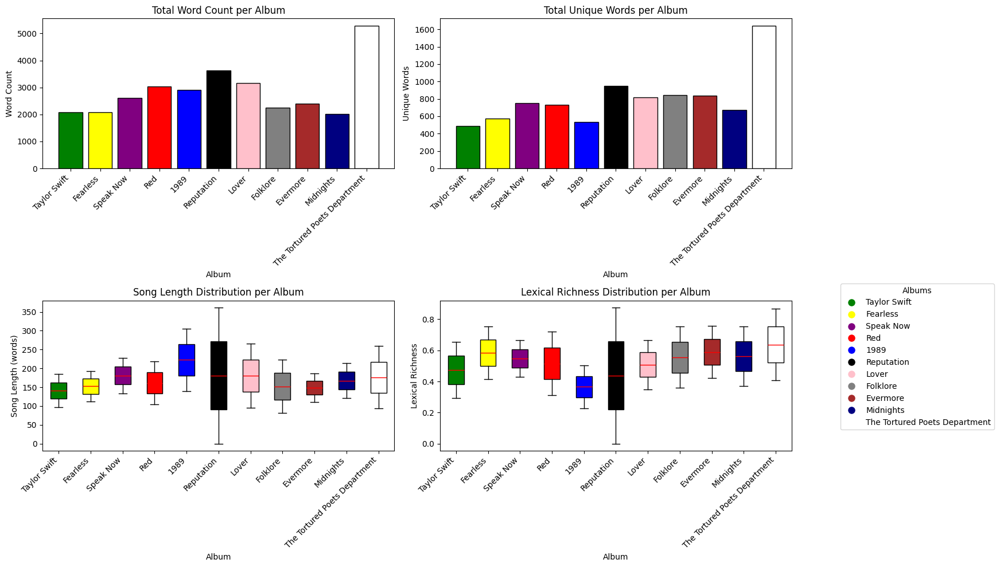

In [36]:
def plot_album_statistics(formatted_album_stats):
    """
    Plots various statistics about the albums, including total word count, unique words,
    song length distribution, and lexical richness distribution.

    This function creates a 2x2 subplot containing:
    1. A bar chart for the total word count per album
    2. A bar chart for the total unique words per album
    3. A box plot for song length distribution per album
    4. A box plot for lexical richness distribution per album

    Each plot is color-coded based on the album name using predefined album colors.

    Parameters:
    - formatted_album_stats (dict): A dictionary containing album-level statistics, where the keys are album names
      and the values are dictionaries with statistics such as total word count, unique word count, and lexical richness.

    Output:
    - Displays a 2x2 grid of plots showing the album statistics with the appropriate titles and labels.
    """

    # Create figure and axes for subplots
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # 1. Bar Chart for Total Word Count per Album
    ax1 = axes[0, 0]
    albums = list(formatted_album_stats.keys())
    word_counts = [stats['Total Word Count'] for stats in formatted_album_stats.values()]

    # Assign colors based on the album name
    colors = [album_colors.get(album, 'lightblue') for album in albums]
    ax1.bar(albums, word_counts, color=colors, edgecolor='black')

    ax1.set_title('Total Word Count per Album')
    ax1.set_xlabel('Album')
    ax1.set_ylabel('Word Count')
    ax1.set_xticklabels(albums, rotation=45, ha="right")

    # 2. Bar Chart for Total Unique Words per Album
    ax2 = axes[0, 1]
    unique_words = [stats['Total Unique Words'] for stats in formatted_album_stats.values()]

    # Assign colors based on the album name
    colors = [album_colors.get(album, 'lightgreen') for album in albums]
    ax2.bar(albums, unique_words, color=colors, edgecolor='black')

    ax2.set_title('Total Unique Words per Album')
    ax2.set_xlabel('Album')
    ax2.set_ylabel('Unique Words')
    ax2.set_xticklabels(albums, rotation=45, ha="right")

    # 3. Box Plot for Song Lengths per Album
    ax3 = axes[1, 0]
    song_lengths = [stats['Song Lengths (min-max)'] for stats in formatted_album_stats.values()]

    # Create a boxplot with different colors for each album
    boxprops = dict(facecolor='lightblue', color='black')
    medianprops = dict(color='red')

    box_plot = ax3.boxplot(song_lengths, labels=albums, patch_artist=True,
                           boxprops=boxprops, medianprops=medianprops)

    # Apply individual colors to each boxplot
    for patch, album in zip(box_plot['boxes'], albums):
        patch.set_facecolor(album_colors.get(album, 'lightblue'))

    ax3.set_title('Song Length Distribution per Album')
    ax3.set_xlabel('Album')
    ax3.set_ylabel('Song Length (words)')
    ax3.set_xticklabels(albums, rotation=45, ha="right")

    # 4. Box Plot for Lexical Richness per Album
    ax4 = axes[1, 1]
    lexical_richness = [stats['Lexical Richness Range (min-max)'] for stats in formatted_album_stats.values()]

    # Create a boxplot with different colors for each album
    box_plot = ax4.boxplot(lexical_richness, labels=albums, patch_artist=True,
                           boxprops=boxprops, medianprops=medianprops)

    # Apply individual colors to each boxplot
    for patch, album in zip(box_plot['boxes'], albums):
        patch.set_facecolor(album_colors.get(album, 'lightgreen'))

    ax4.set_title('Lexical Richness Distribution per Album')
    ax4.set_xlabel('Album')
    ax4.set_ylabel('Lexical Richness')
    ax4.set_xticklabels(albums, rotation=45, ha="right")

    # Create handles for the legend and labels for the albums
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) for color in album_colors.values()]
    labels = list(album_colors.keys())

    # Adjust layout to avoid overlapping with legend
    plt.tight_layout()

    # Place the legend outside the plot area
    fig.legend(handles, labels, title='Albums', loc='upper left', bbox_to_anchor=(1.05, 0.5), borderaxespad=0.)

    # Show the plots
    plt.show()

plot_album_statistics(formatted_album_stats)

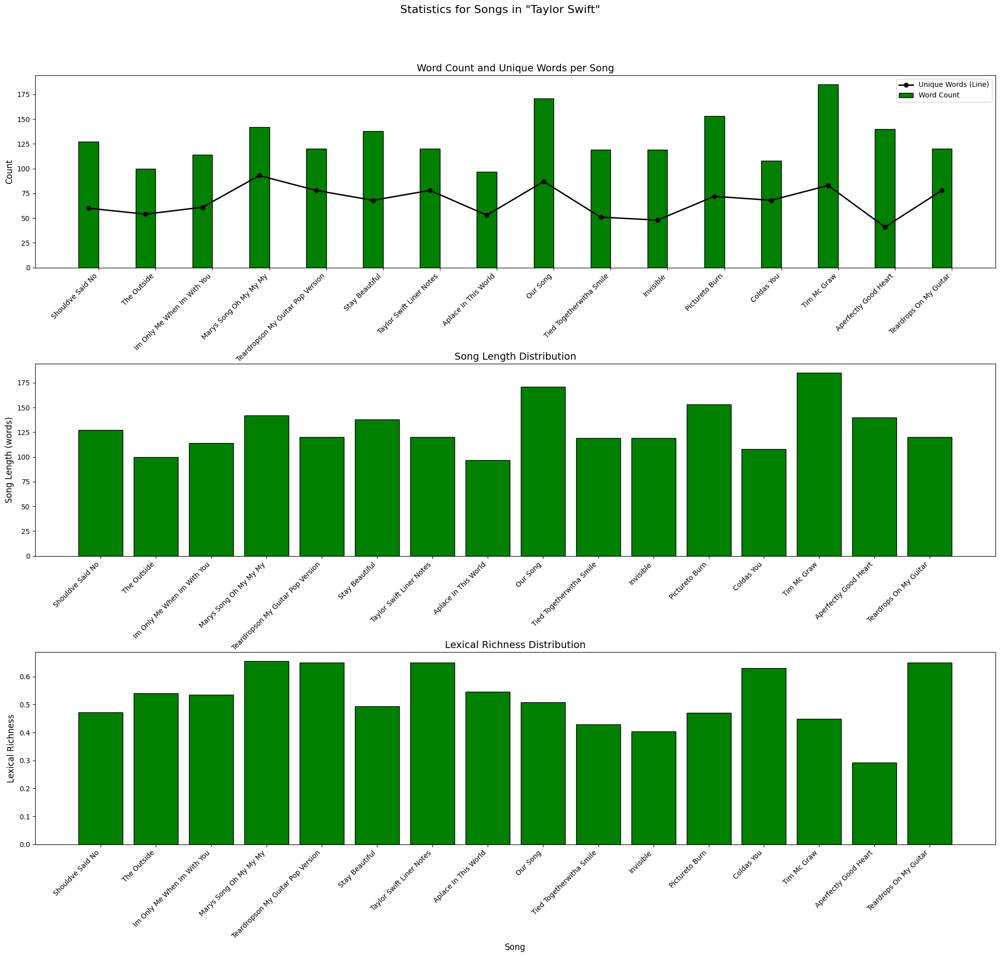

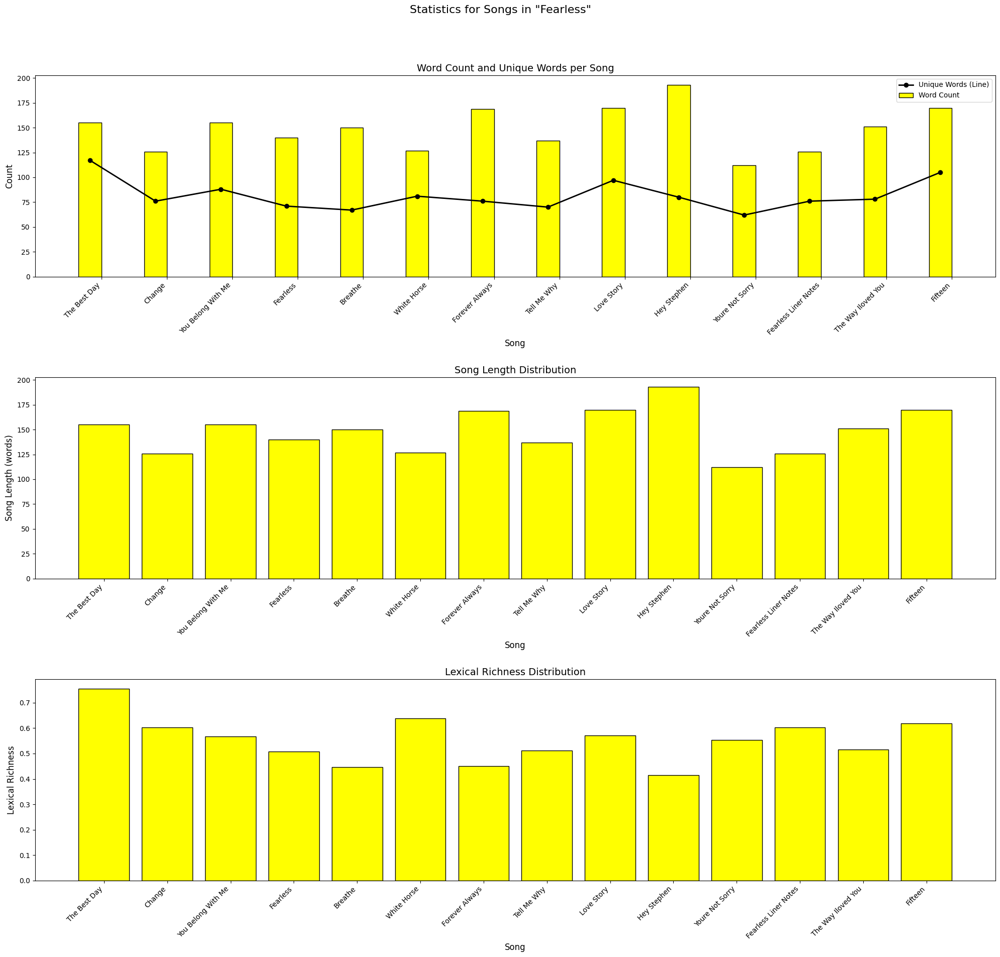

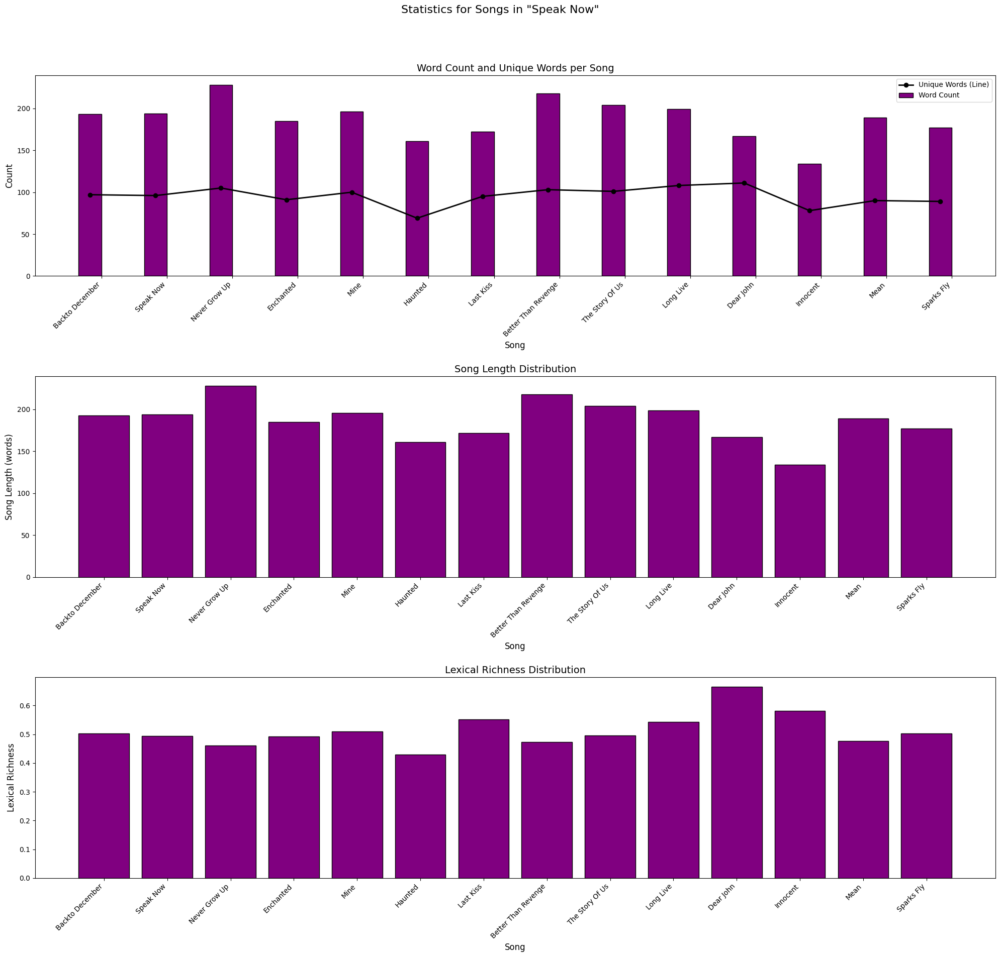

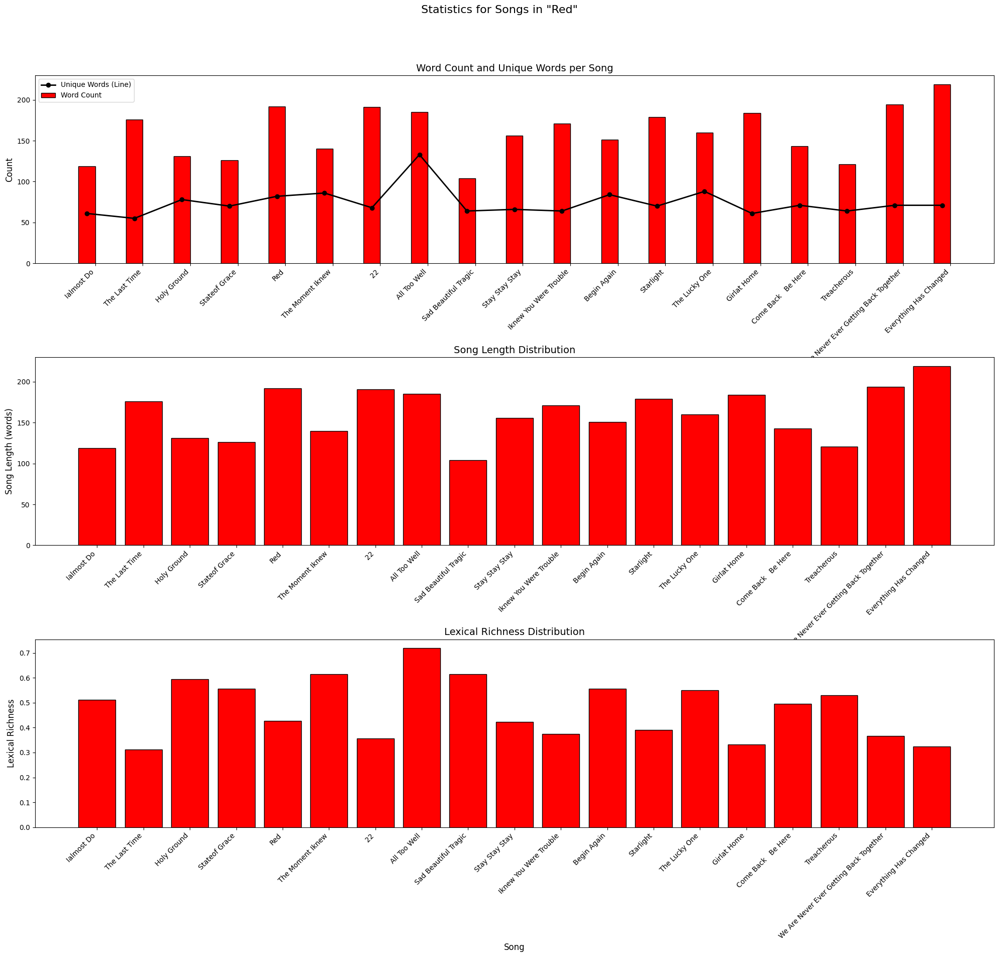

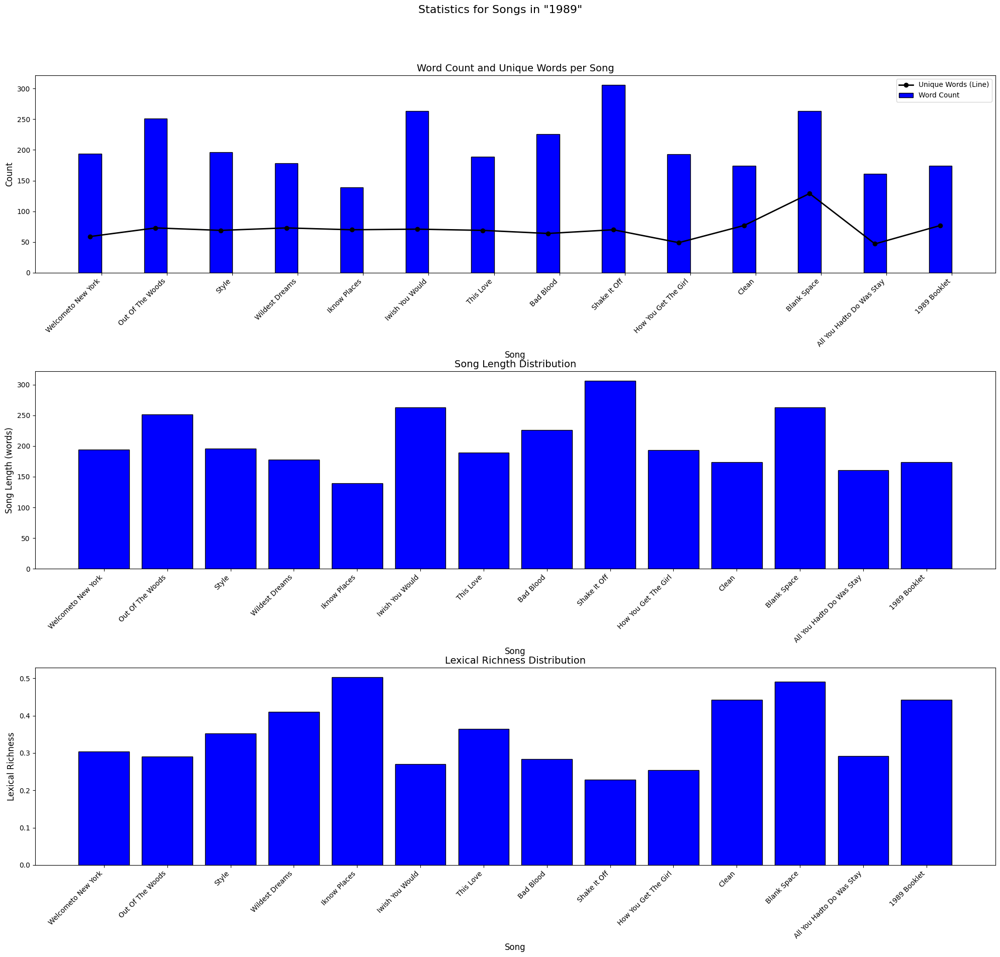

...

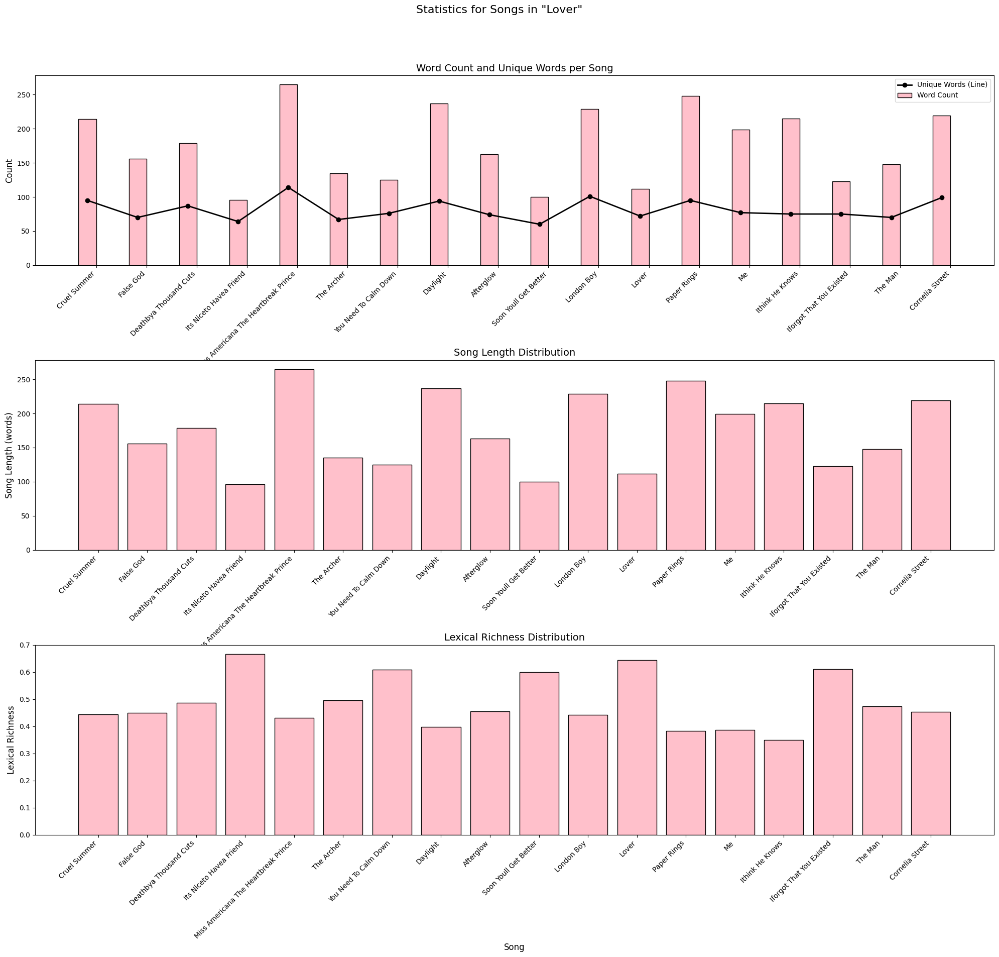

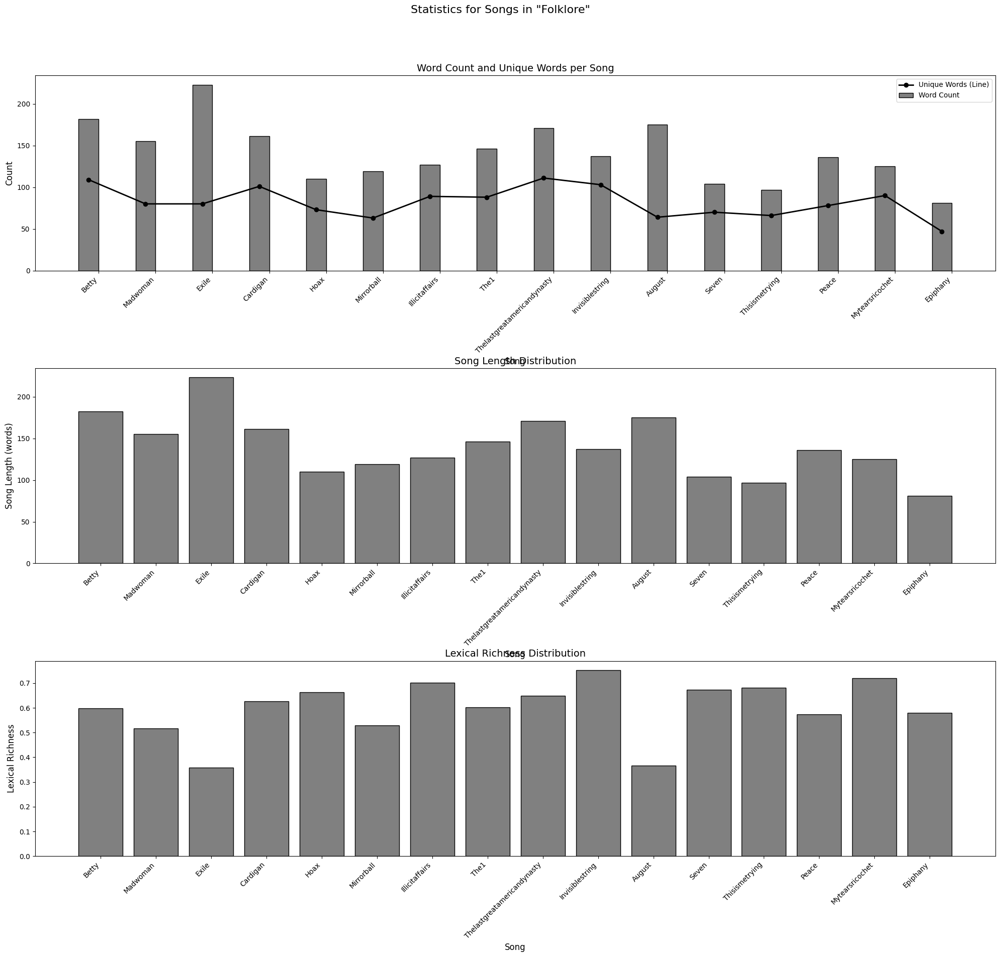

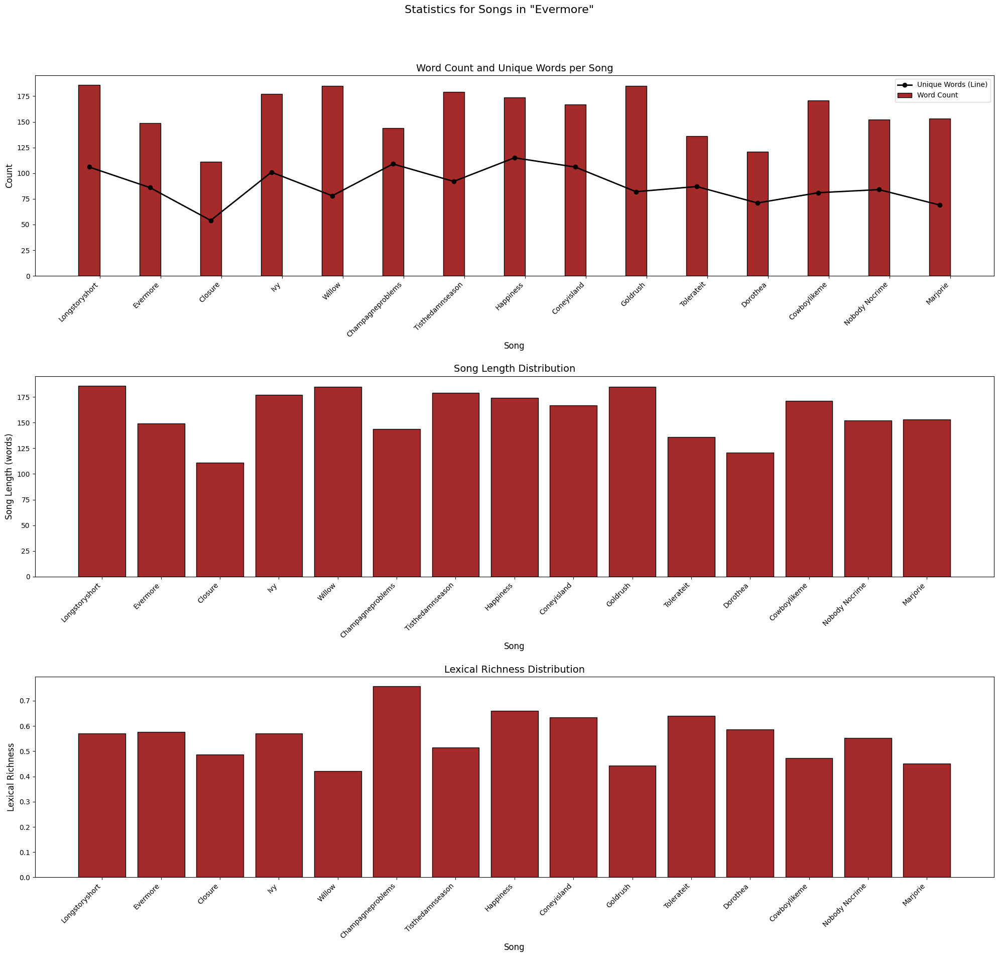

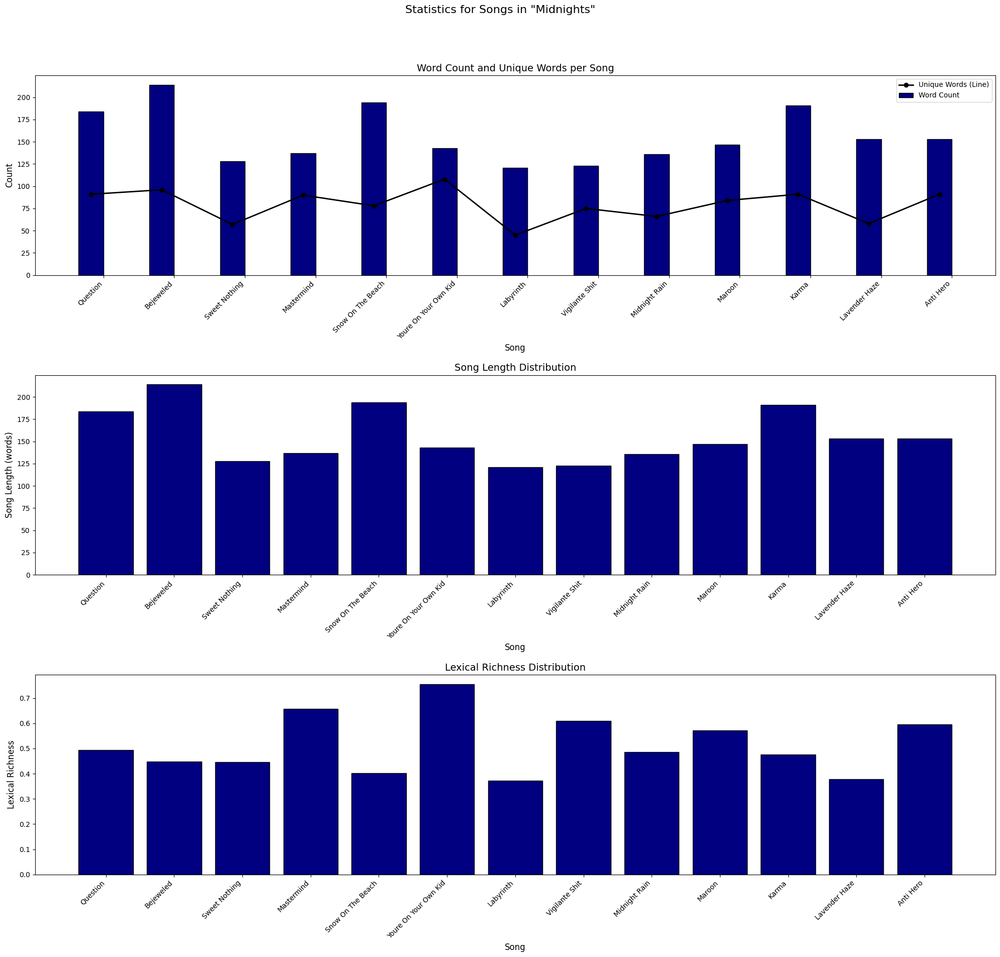

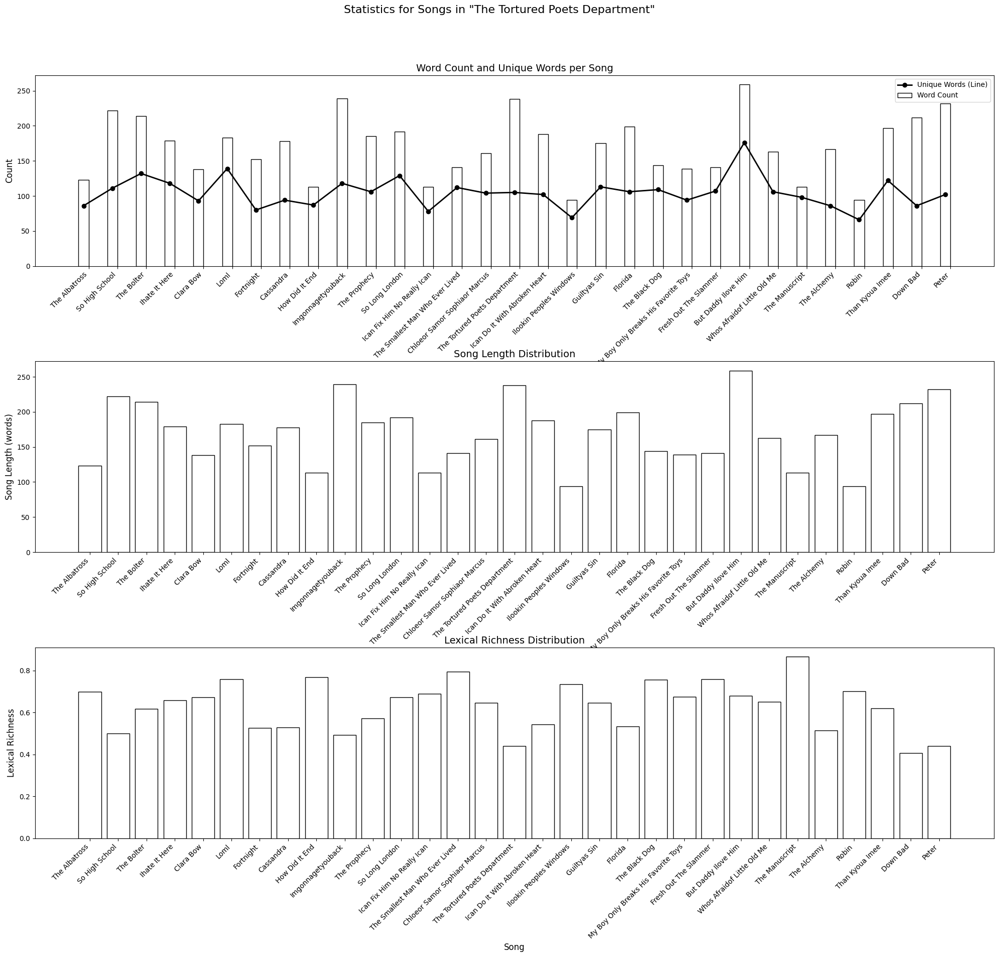

In [37]:
def plot_song_statistics(formatted_album_stats):
    """
    Plots statistics for individual songs within each album. This includes:
    1. A combined bar chart showing the word count and unique word count for each song.
    2. A bar chart showing the distribution of song lengths (in terms of word count) per song.
    3. A bar chart displaying the lexical richness distribution for each song.

    The function generates a set of plots for each album, creating visualizations that help to compare
    the song statistics across different tracks in each album.

    Parameters:
    - formatted_album_stats (dict): A dictionary where each key is an album name and the value is a dictionary containing
      detailed statistics for each song in that album. Each song's stats include word count, unique words, song length,
      and lexical richness.

    Output:
    - Generates and displays individual plots for each album with song-level statistics.
    """

    # Iterate through each album to create individual song statistics plots
    for album, stats in formatted_album_stats.items():
        # Extract song details
        songs = stats['Songs']
        song_names = [song['Song Name'] for song in songs]
        word_counts = [song['Word Count'] for song in songs]
        unique_words = [song['Unique Words'] for song in songs]
        song_lengths = [song['Song Length'] for song in songs]
        lexical_richness = [song['Lexical Richness'] for song in songs]
        album_color = album_colors.get(album, 'grey')  # Default to grey if album color not found

        # Create a figure for this album
        fig, axes = plt.subplots(3, 1, figsize=(20, 20))
        fig.suptitle(f'Statistics for Songs in "{album}"', fontsize=16, y=0.95)

        # 1. Combined Bar Chart for Word Count and Unique Words per Song + Line Graph
        ax1 = axes[0]
        bar_width = 0.35  # Width of the bars
        index = np.arange(len(song_names))  # X locations for the groups

        # Plot both bars for Word Count and Unique Words side by side
        ax1.bar(index, word_counts, bar_width, color=album_color, edgecolor='black', label='Word Count')
        ax1.plot(index, unique_words, color='black', marker='o', markerfacecolor='black', linestyle='-', linewidth=2, label='Unique Words (Line)')

        ax1.set_title('Word Count and Unique Words per Song', fontsize=14)
        ax1.set_xlabel('Song', fontsize=12)
        ax1.set_ylabel('Count', fontsize=12)
        ax1.set_xticks(index + bar_width / 2)  # Center the x-ticks between the bars
        ax1.set_xticklabels(song_names, rotation=45, ha="right", fontsize=10)
        ax1.legend()

        # 2. Bar Chart for Song Length Distribution (not histogram, just bar chart)
        ax2 = axes[1]
        ax2.bar(range(len(song_lengths)), song_lengths, color=album_color, edgecolor='black')
        ax2.set_title('Song Length Distribution', fontsize=14)
        ax2.set_xlabel('Song', fontsize=12)
        ax2.set_ylabel('Song Length (words)', fontsize=12)
        ax2.set_xticks(range(len(song_names)))  # Update x-ticks to match the number of songs
        ax2.set_xticklabels(song_names, rotation=45, ha="right", fontsize=10)

        # 3. Bar Chart for Lexical Richness Distribution (not histogram, just bar chart)
        ax3 = axes[2]
        ax3.bar(range(len(lexical_richness)), lexical_richness, color=album_color, edgecolor='black')
        ax3.set_title('Lexical Richness Distribution', fontsize=14)
        ax3.set_xlabel('Song', fontsize=12)
        ax3.set_ylabel('Lexical Richness', fontsize=12)
        ax3.set_xticks(range(len(song_names)))  # Update x-ticks to match the number of songs
        ax3.set_xticklabels(song_names, rotation=45, ha="right", fontsize=10)

        # Adjust layout for better spacing
        plt.tight_layout()
        plt.subplots_adjust(top=0.88, hspace=0.5)

        # Show the plot for this album
        plt.show()

# Example: You'd call the function with the formatted_album_stats data
plot_song_statistics(formatted_album_stats)

# Sentiment Analysis

Album Sentiment Analysis Output:
                              avg_polarity avg_subjectivity
Taylor Swift                      0.822756         0.622688
Fearless                          0.751721         0.599143
Speak Now                         0.302007         0.618786
Red                               0.831058         0.592947
1989                              0.211564           0.5555
Reputation                        0.745184         0.553211
Lover                             0.450711         0.532833
Folklore                          0.270962         0.619812
Evermore                          0.271387         0.563533
Midnights                         0.532585         0.597077
The Tortured Poets Department      0.11439          0.60371


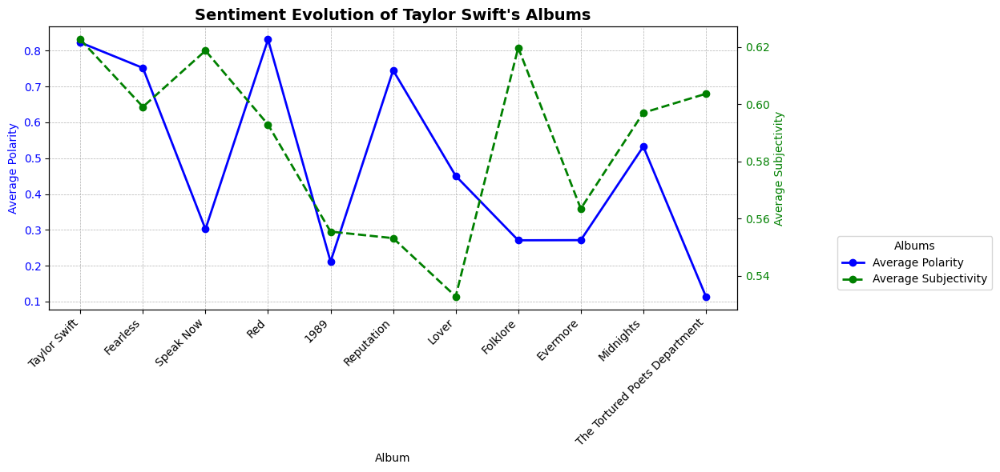

In [38]:
# Function to calculate average sentiment for each album
def calculate_album_sentiment(songs_data):
    """
    Calculates the average sentiment (polarity and subjectivity) for each album based on the sentiment of individual songs.

    Parameters:
    - songs_data (dict): A dictionary where each key is a song title and the value is another dictionary containing song details,
      including sentiment information (polarity and subjectivity).

    Returns:
    - album_sentiment (dict): A dictionary where each key is an album name and the value is a dictionary with the average polarity
      and subjectivity for that album.
    """
    album_sentiment = {}

    # Iterate over all songs to collect sentiment data
    for song_title, song_info in songs_data.items():
        album = song_info['album']
        polarity = song_info['sentiment']['Polarity']
        if album not in album_sentiment:
            album_sentiment[album] = {'polarity': [], 'subjectivity': []}

        album_sentiment[album]['polarity'].append(polarity)
        album_sentiment[album]['subjectivity'].append(song_info['sentiment']['Subjectivity'])

    # Calculate average sentiment for each album
    for album, sentiment_values in album_sentiment.items():
        avg_polarity = np.mean(sentiment_values['polarity'])
        avg_subjectivity = np.mean(sentiment_values['subjectivity'])
        album_sentiment[album]['avg_polarity'] = avg_polarity
        album_sentiment[album]['avg_subjectivity'] = avg_subjectivity

    return album_sentiment

# Example usage: Calculate sentiment for each album
album_sentiment = calculate_album_sentiment(songs_data)

# Convert output to a DataFrame for clearer representation
album_sentiment_df = pd.DataFrame(album_sentiment).T[['avg_polarity', 'avg_subjectivity']]
print("Album Sentiment Analysis Output:")
print(album_sentiment_df)


def plot_sentiment_evolution(album_sentiment):
    """
    Plots the sentiment evolution (polarity and subjectivity) of Taylor Swift's albums over time.

    Parameters:
    - album_sentiment (dict): A dictionary where each key is an album name and the value is a dictionary containing the
      average polarity and subjectivity for each album.

    Output:
    - A plot that shows the average polarity and subjectivity over time, with two y-axes for better visualization of both metrics.
    """

    # Prepare data for plotting
    albums = list(album_sentiment.keys())
    avg_polarity = [album_sentiment[album]['avg_polarity'] for album in albums]
    avg_subjectivity = [album_sentiment[album]['avg_subjectivity'] for album in albums]

    # Plot sentiment evolution
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot Polarity (sentiment)
    ax1.plot(albums, avg_polarity, color='blue', marker='o', label='Average Polarity', linestyle='-', linewidth=2)
    ax1.set_xlabel('Album')
    ax1.set_ylabel('Average Polarity', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_xticklabels(albums, rotation=45, ha="right")
    ax1.grid(True, which='both', linestyle='--', linewidth=0.5)

    # Create a second y-axis for Subjectivity
    ax2 = ax1.twinx()
    ax2.plot(albums, avg_subjectivity, color='green', marker='o', label='Average Subjectivity', linestyle='--', linewidth=2)
    ax2.set_ylabel('Average Subjectivity', color='green')
    ax2.tick_params(axis='y', labelcolor='green')

    # Title and legend
    plt.title('Sentiment Evolution of Taylor Swift\'s Albums', fontsize=14, fontweight='bold')
    fig.tight_layout()
    fig.legend(title='Albums', loc='upper left', bbox_to_anchor=(1.05, 0.5), borderaxespad=0.)

    plt.show()

# Example usage: Plot sentiment evolution
plot_sentiment_evolution(album_sentiment)


# Top Songs by Sentiment and Lexical Richness


Top 10 Songs with Highest Sentiment Polarity:
                                   Song  Sentiment Polarity         Album
0                    Welcometo New York              0.9991          1989
1                            London Boy              0.9991         Lover
2                      Out Of The Woods              0.9989          1989
3                                 Dress              0.9985    Reputation
4  This Is Why We Cant Have Nice Things              0.9982    Reputation
5                        Stay Beautiful              0.9981  Taylor Swift
6                              Fearless              0.9980      Fearless
7                Everything Has Changed              0.9979           Red
8                 Call It What You Want              0.9978    Reputation
9                           Hey Stephen              0.9977      Fearless

Top 10 Songs with Highest Lexical Richness:
                              Song  Lexical Richness  \
0         Why She Disappeared Poem    

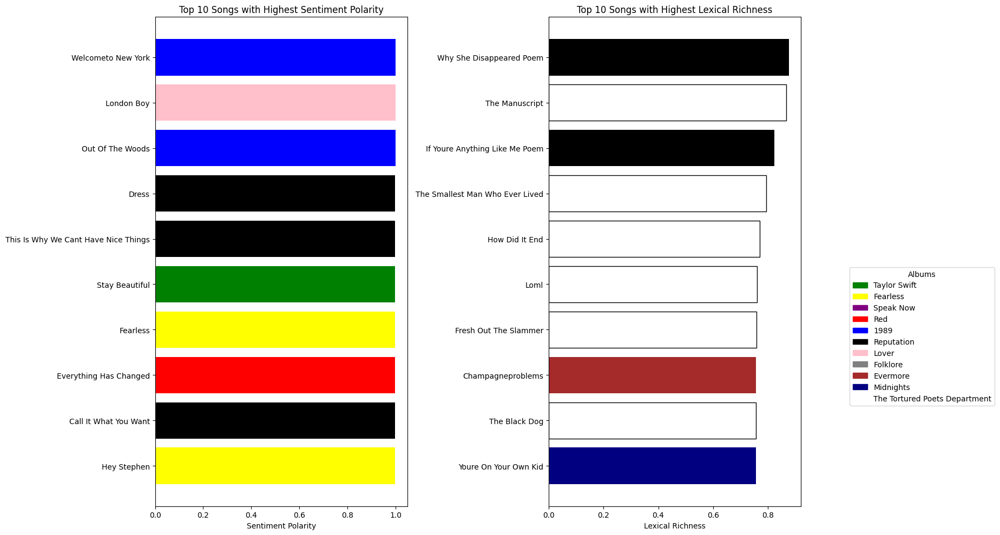

In [39]:
def plot_top_songs(songs_data):
    """
    Plots the top 10 songs with the highest sentiment polarity and lexical richness, and prints them as tables.

    Parameters:
    - songs_data (dict): A dictionary where each key is a song title and the value is a dictionary containing song details,
      including sentiment polarity and lexical richness statistics.

    Output:
    - Two bar charts showing the top 10 songs based on sentiment polarity and lexical richness, respectively.
    - Two printed tables: one listing the top 10 songs with the highest sentiment polarity and the other listing the top 10 songs
      with the highest lexical richness.
    """
    # Extract data for sentiment polarity, lexical richness, and album
    sentiment_data = [(song, data['sentiment']['Polarity'], data['album']) for song, data in songs_data.items()]
    lexical_data = [(song, data['stats']['Lexical Richness'], data['album']) for song, data in songs_data.items()]

    # Sort data to get the top 10 for each metric
    top_sentiment = sorted(sentiment_data, key=lambda x: x[1], reverse=True)[:10]
    top_lexical = sorted(lexical_data, key=lambda x: x[1], reverse=True)[:10]

    # Extract values for plotting
    sentiment_songs, sentiment_scores, sentiment_albums = zip(*top_sentiment)
    lexical_songs, lexical_scores, lexical_albums = zip(*top_lexical)

    # Create a DataFrame for sentiment data
    sentiment_df = pd.DataFrame({
        'Song': sentiment_songs,
        'Sentiment Polarity': sentiment_scores,
        'Album': sentiment_albums
    })

    # Create a DataFrame for lexical richness data
    lexical_df = pd.DataFrame({
        'Song': lexical_songs,
        'Lexical Richness': lexical_scores,
        'Album': lexical_albums
    })

    # Print the tables for both metrics
    print("\nTop 10 Songs with Highest Sentiment Polarity:")
    print(sentiment_df)
    print("\nTop 10 Songs with Highest Lexical Richness:")
    print(lexical_df)

    # Create a figure for the bar charts
    fig, axes = plt.subplots(1, 2, figsize=(15, 10))

    # Plot top sentiment songs with a custom edge color for white bars
    sentiment_colors = [album_colors[album] for album in sentiment_albums]
    sentiment_edgecolor = ['black' if color == 'white' else 'none' for color in sentiment_colors]
    axes[0].barh(sentiment_songs, sentiment_scores, color=sentiment_colors, edgecolor=sentiment_edgecolor)
    axes[0].set_title("Top 10 Songs with Highest Sentiment Polarity")
    axes[0].set_xlabel("Sentiment Polarity")
    axes[0].invert_yaxis()  # Invert y-axis for better readability

    # Plot top lexical richness songs with a custom edge color for white bars
    lexical_colors = [album_colors[album] for album in lexical_albums]
    lexical_edgecolor = ['black' if color == 'white' else 'none' for color in lexical_colors]
    axes[1].barh(lexical_songs, lexical_scores, color=lexical_colors, edgecolor=lexical_edgecolor)
    axes[1].set_title("Top 10 Songs with Highest Lexical Richness")
    axes[1].set_xlabel("Lexical Richness")
    axes[1].invert_yaxis()  # Invert y-axis for better readability

    # Create the legend entries
    handles = [Patch(color=color, label=album, edgecolor='black', linewidth=1) for album, color in album_colors.items()]
    labels = [h.get_label() for h in handles]  # Extract labels from the Patch objects

    # Add the legend using both handles and label, positioned outside the plot
    fig.legend(handles, labels, title='Albums', loc='upper left', bbox_to_anchor=(1.05, 0.5), borderaxespad=0.)

    # Adjust layout and show the plots
    plt.tight_layout()
    plt.show()

# Example usage: Call the function to plot the charts and print the tables
plot_top_songs(songs_data)


# Entities Analysis

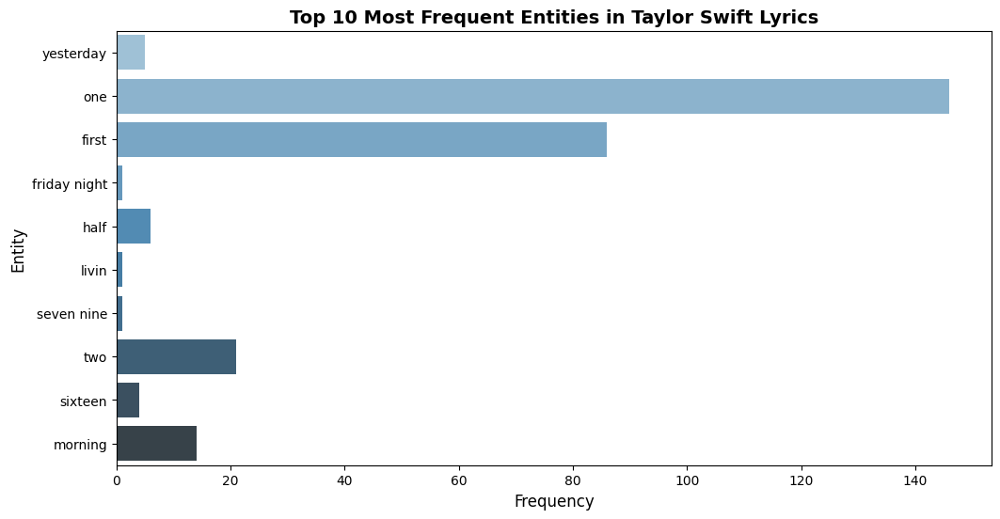

In [40]:
def extract_entities(lyrics):
    """
    Extract named entities from song lyrics using SpaCy.

    Parameters:
    - lyrics (str): A string containing the lyrics of a song.

    Returns:
    - entities (list): A list of tuples, where each tuple contains an entity (str) and its type (str).
    """
    doc = nlp(lyrics)  # Process lyrics using SpaCy's NLP pipeline
    entities = [(ent.text, ent.label_) for ent in doc.ents]  # Extract named entities and their labels
    return entities

def create_knowledge_graph(songs_data):
    """
    Create a knowledge graph of named entities across all songs.

    Parameters:
    - songs_data (dict): A dictionary where each key is a song title, and the value is a dictionary containing song details
      such as lyrics.

    Returns:
    - entity_links (dict): A dictionary where the keys are named entities (str) and the values are dictionaries with:
        - 'count': The number of occurrences of the entity across all songs (int).
        - 'labels': A list of entity types (str) associated with the entity.
    """
    entity_links = {}

    for song_title, song_info in songs_data.items():
        entities = extract_entities(song_info['lyrics'])  # Extract entities from the song lyrics
        for entity, label in entities:
            if entity not in entity_links:
                entity_links[entity] = {'count': 0, 'labels': []}  # Initialize the entity if not seen before
            entity_links[entity]['count'] += 1  # Increment the entity count
            entity_links[entity]['labels'].append(label)  # Append the entity type to the list of labels

    return entity_links

# Generate and plot knowledge graph for entities
entity_links = create_knowledge_graph(songs_data)

# Visualize the top 10 most frequent entities
entities = list(entity_links.keys())[:10]  # Get the top 10 most frequent entities
counts = [entity_links[entity]['count'] for entity in entities]  # Get their frequency counts

# Plot the top 10 most frequent entities
plt.figure(figsize=(12, 6))
sns.barplot(x=counts, y=entities, palette='Blues_d')  # Bar plot of the frequencies
plt.title('Top 10 Most Frequent Entities in Taylor Swift Lyrics', fontsize=14, fontweight='bold')
plt.xlabel('Frequency', fontsize=12)
plt.ylabel('Entity', fontsize=12)
plt.show()


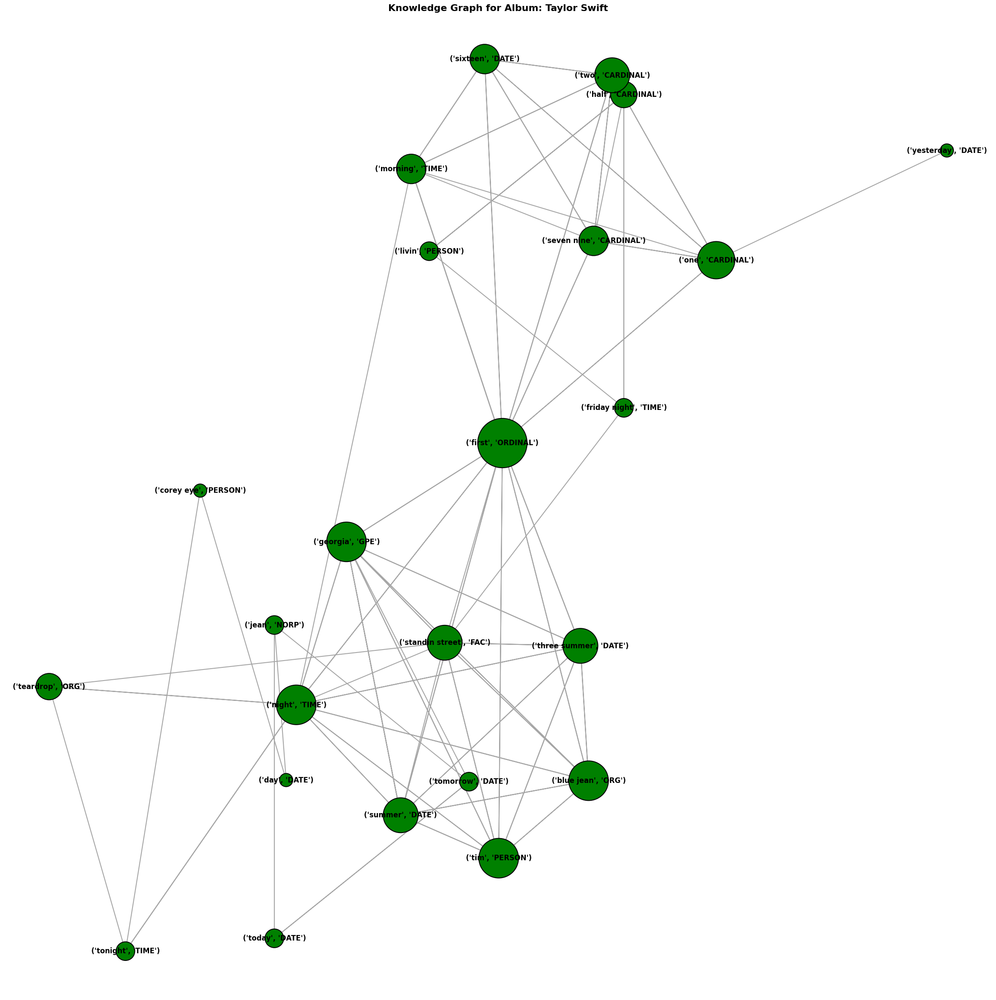

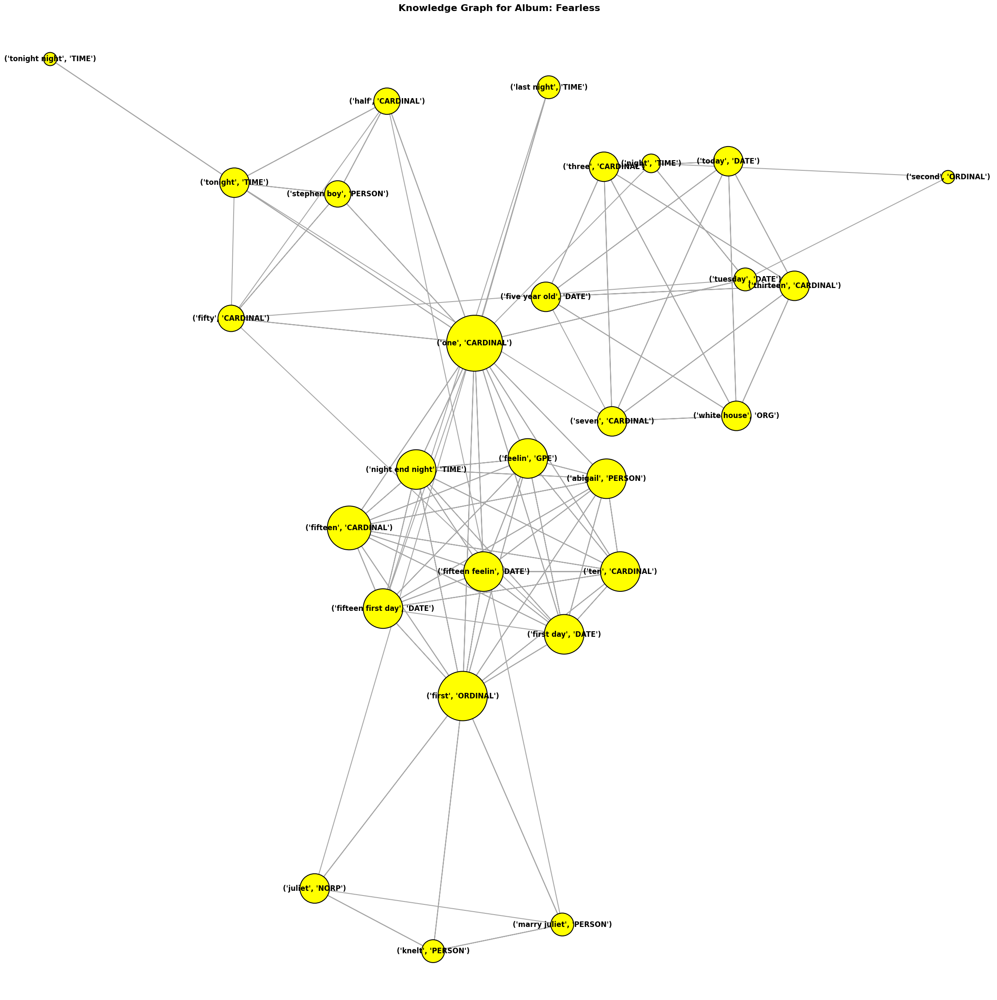

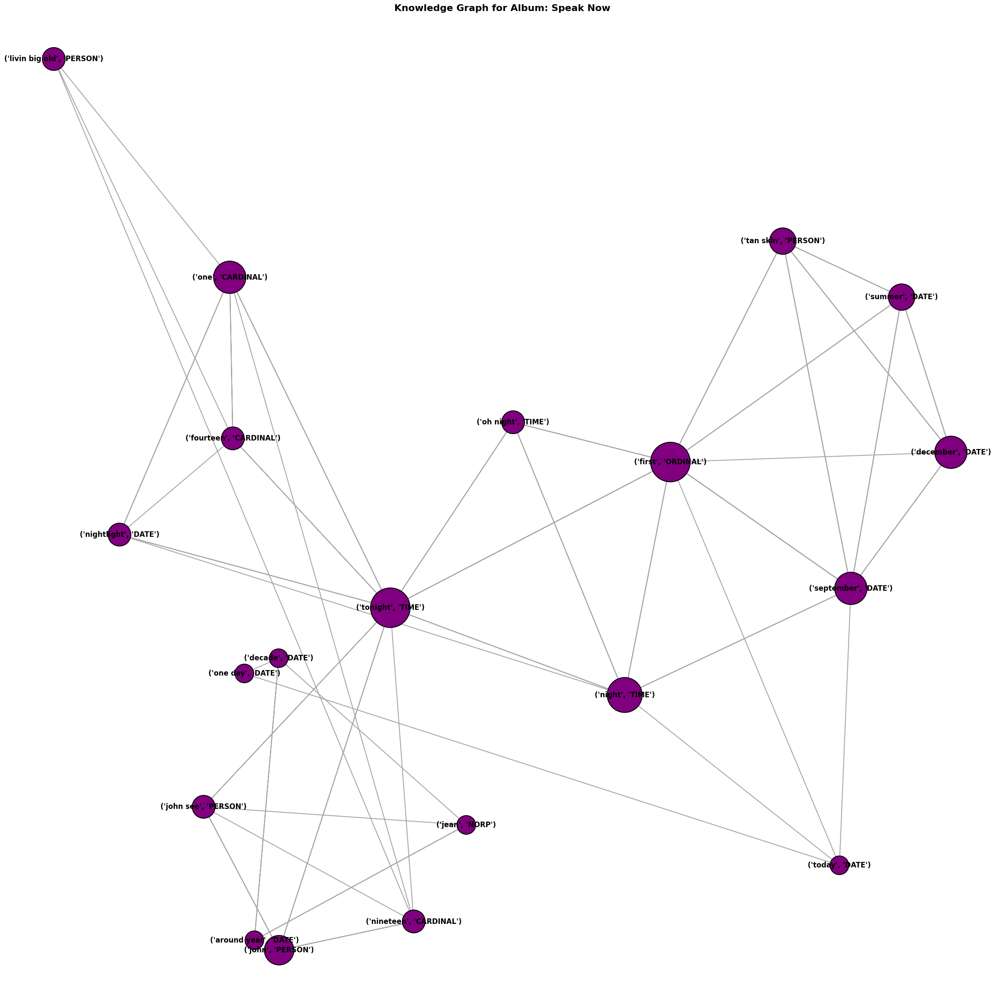

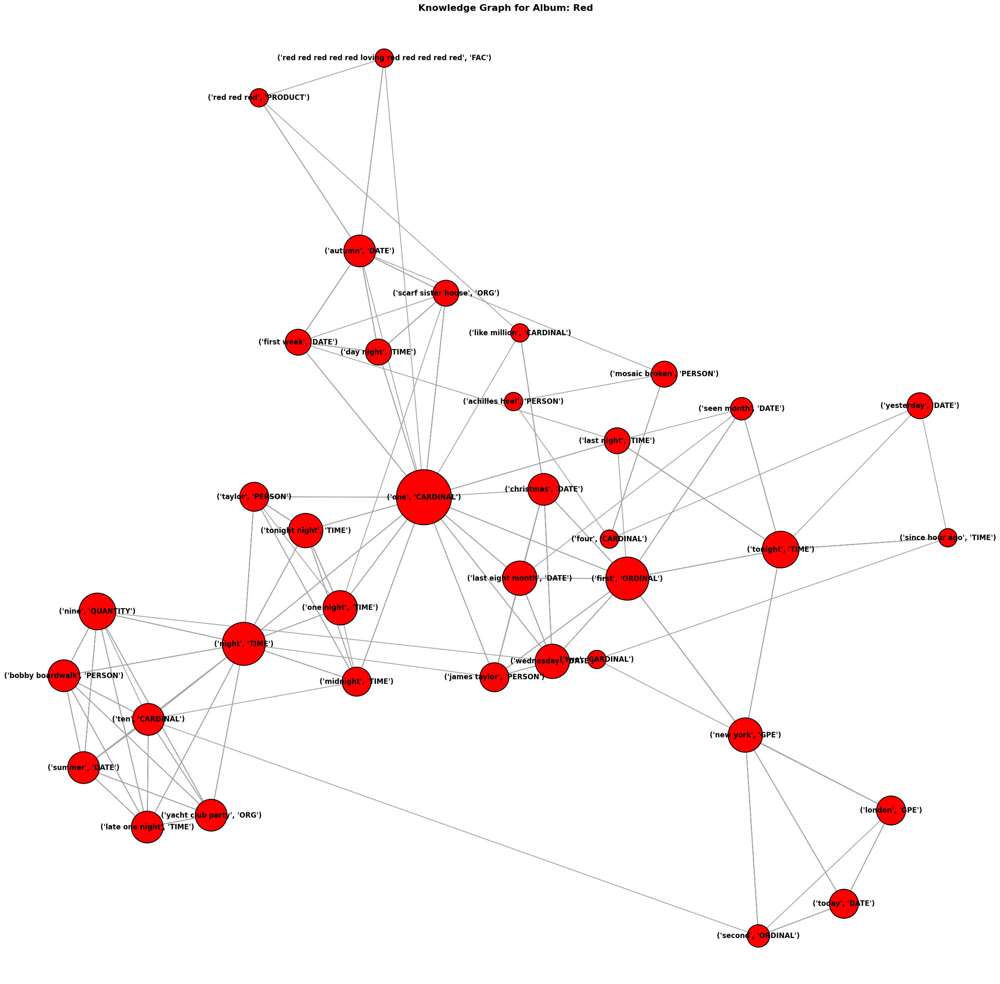

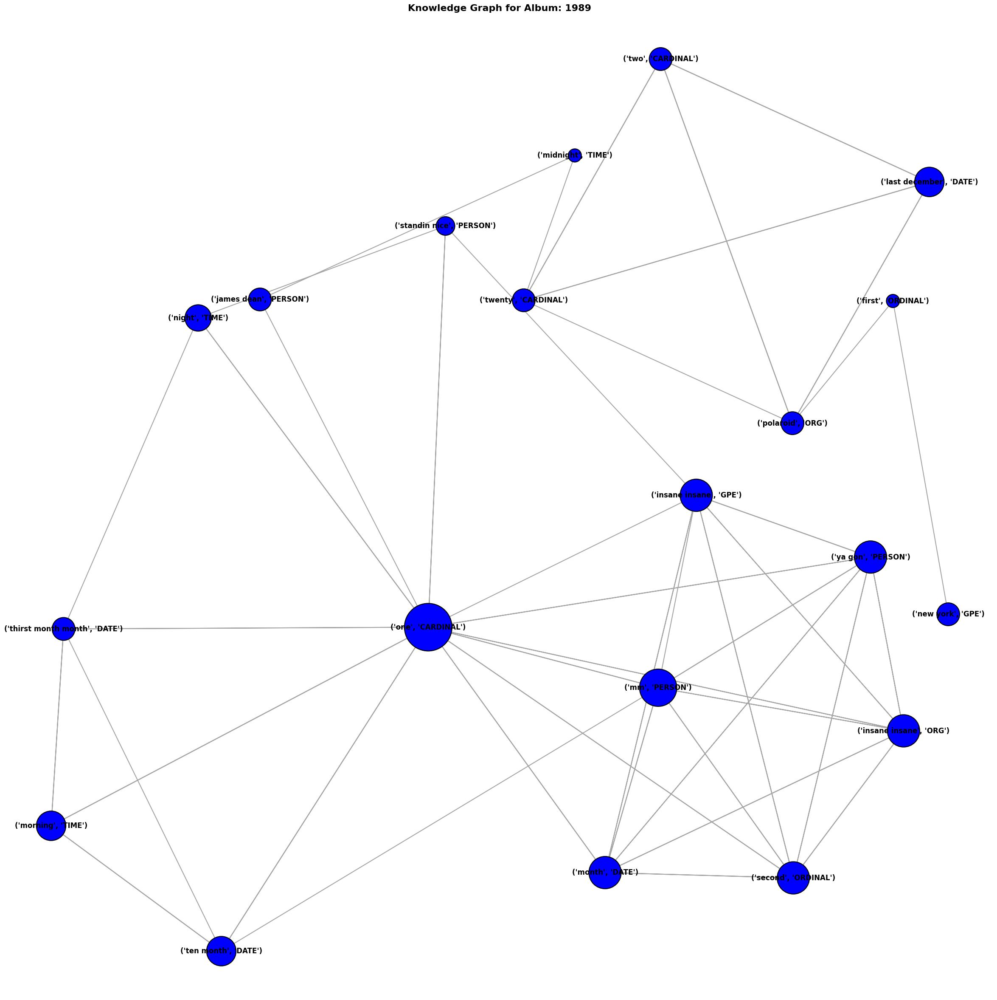

...

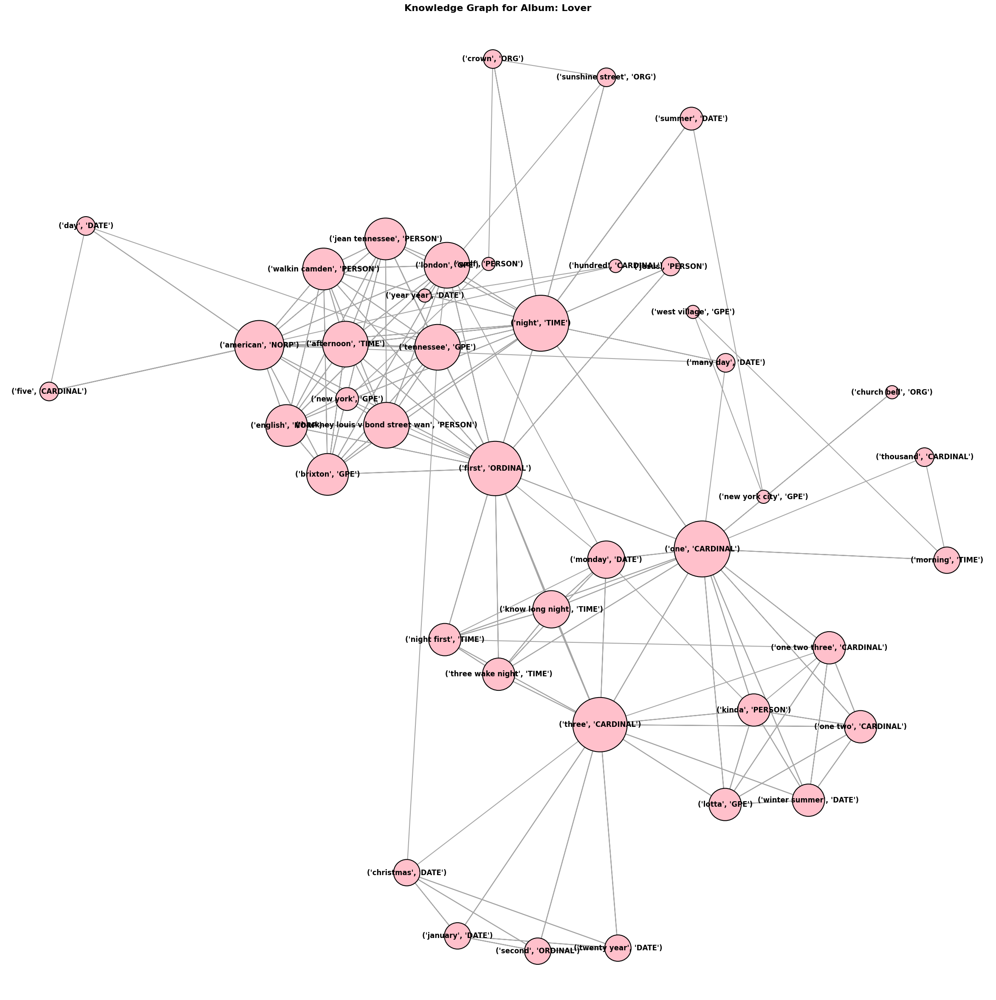

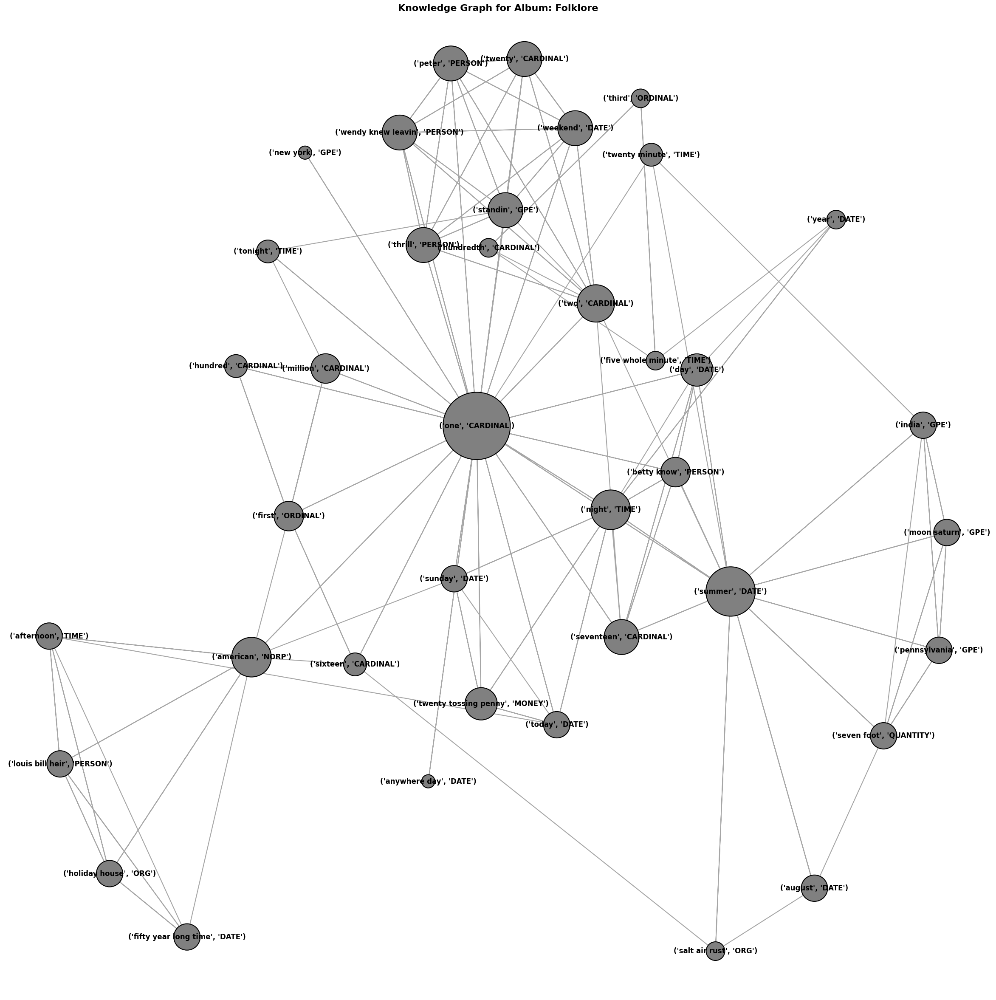

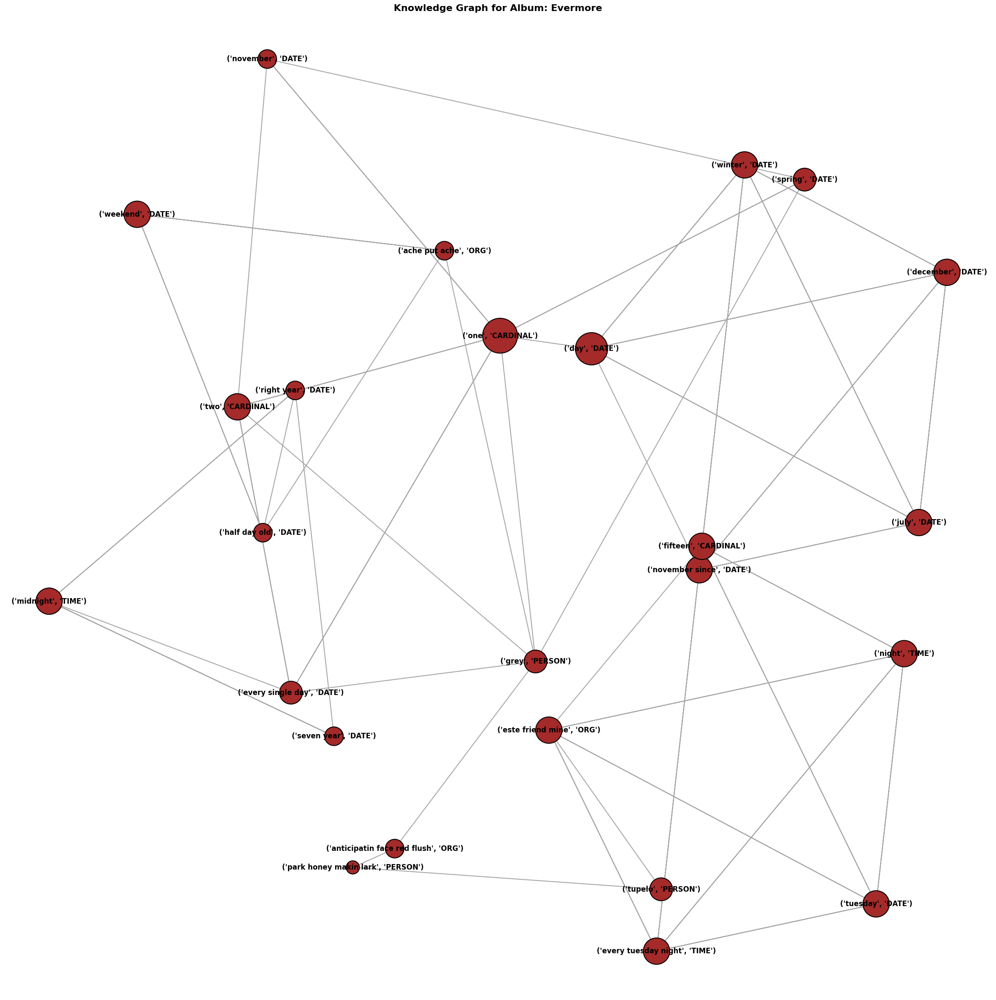

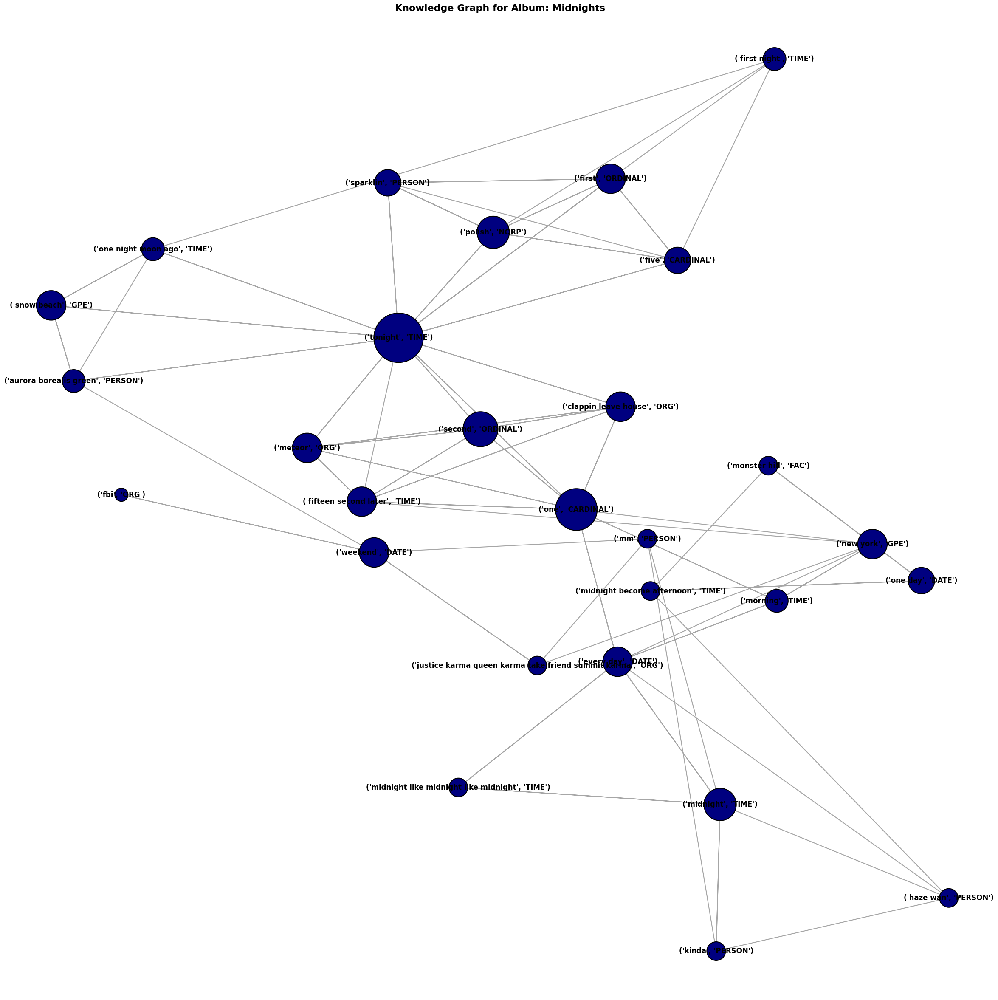

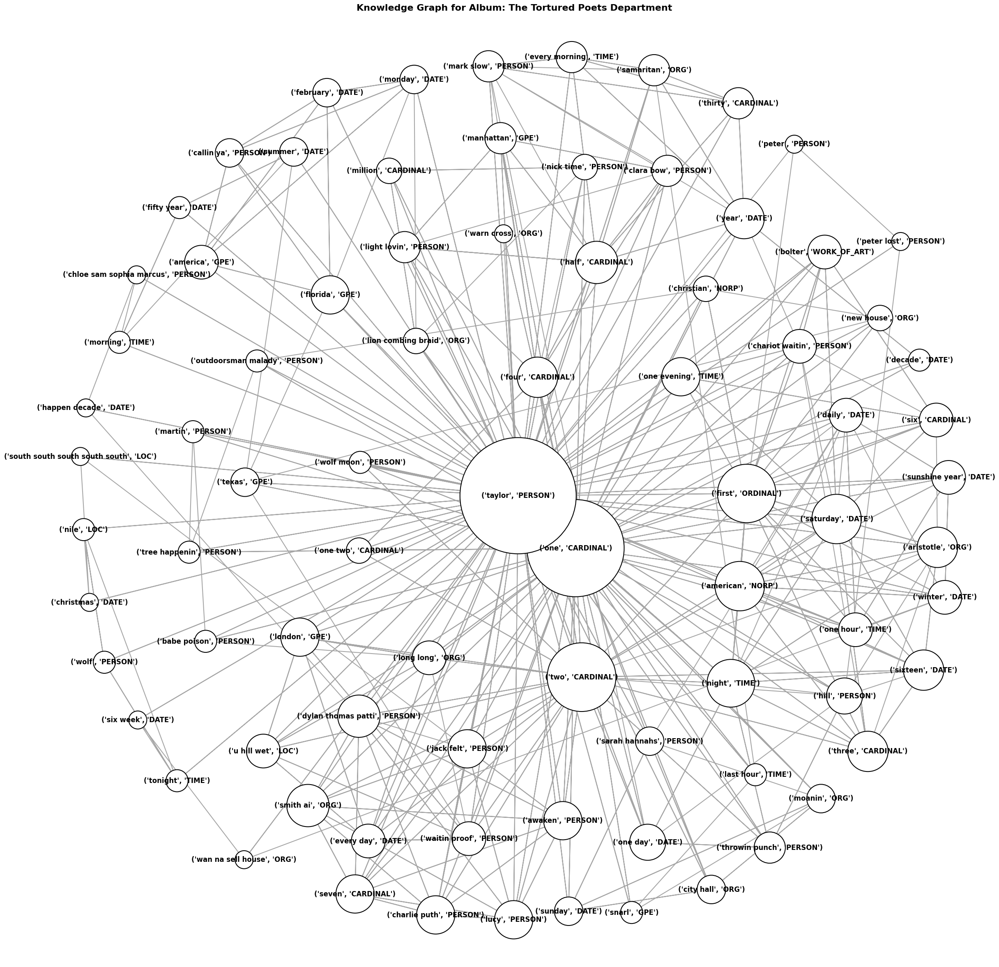

In [41]:
def create_album_graph(songs_data):
    """
    Create a knowledge graph for each album, where nodes are entities
    and edges represent co-occurrences within a song's lyrics.

    Parameters:
    - songs_data (dict): A dictionary with song titles as keys and song details (including lyrics) as values.
      Example:
      {
        "song_title": {
          "album": "album_name",
          "lyrics": "song_lyrics"
        }
      }

    Returns:
    - album_graphs (dict): A dictionary where keys are album names, and values are the corresponding networkx graphs.
    - entity_cooccurrences (dict): A dictionary of co-occurrences for each album, represented as a Counter object.
      Example:
      {
        "album_name": {
          ("entity_1", "entity_2"): co_occurrence_count
        }
      }
    """
    album_graphs = {}  # Initialize dictionary to store graphs for each album
    entity_cooccurrences = {}  # Initialize dictionary to store entity co-occurrence counts for each album

    for song_info in songs_data.values():
        album = song_info['album']  # Extract the album name

        # Initialize graph and co-occurrence counter for the album if not already present
        if album not in album_graphs:
            album_graphs[album] = nx.Graph()  # Create an empty graph for the album
            entity_cooccurrences[album] = Counter()  # Initialize the counter for co-occurrences

        entities = extract_entities(song_info['lyrics'])  # Extract named entities from the song lyrics

        # Add edges for co-occurring entities and count co-occurrences
        for i in range(len(entities)):
            for j in range(i + 1, len(entities)):
                album_graphs[album].add_edge(entities[i], entities[j])  # Add edge between two co-occurring entities
                entity_cooccurrences[album][(entities[i], entities[j])] += 1  # Increment the co-occurrence count

    return album_graphs, entity_cooccurrences

def visualize_album_graphs(album_graphs, album_colors):
    """
    Visualize the knowledge graphs for each album with improved styling.

    Parameters:
    - album_graphs (dict): A dictionary of graphs for each album, where keys are album names, and values are networkx graphs.
    - album_colors (dict): A dictionary mapping album names to their respective colors.
      This is used for color coding the nodes based on their album.

    This function generates and displays a graph for each album, where nodes represent named entities,
    and edges represent co-occurrence relationships between entities within a song's lyrics.
    """
    for album, graph in album_graphs.items():
        # Use Kamada-Kawai layout for a more organized graph
        pos = nx.kamada_kawai_layout(graph, weight='weight')  # Compute the layout positions for the graph

        # Prepare data for the edges
        edge_x = []
        edge_y = []
        for edge in graph.edges():
            x0, y0 = pos[edge[0]]  # Get the positions of the nodes for each edge
            x1, y1 = pos[edge[1]]
            edge_x.append(x0)
            edge_x.append(x1)
            edge_y.append(y0)
            edge_y.append(y1)

        # Prepare data for the nodes
        node_x = [pos[node][0] for node in graph.nodes()]  # Extract x-coordinates of the nodes
        node_y = [pos[node][1] for node in graph.nodes()]  # Extract y-coordinates of the nodes

        # Plot the graph
        plt.figure(figsize=(30, 30))  # Set the figure size

        # Plot edges with a light gray color and increased width
        plt.plot(edge_x, edge_y, color='gray', linewidth=1.5, alpha=0.7)

        # Plot nodes with a larger size and a color based on the album
        node_colors = [album_colors[album]] * len(graph.nodes())  # Assign the album's color to each node
        node_sizes = [500 * graph.degree(node) for node in graph.nodes()]  # Node size based on degree (number of connections)
        plt.scatter(node_x, node_y, s=node_sizes, c=node_colors, edgecolors='black', linewidth=1.5, zorder=5)

        # Annotate the nodes with labels
        for node, (x, y) in pos.items():
            plt.text(x, y, node, fontsize=12, ha='center', va='center', fontweight='bold', zorder=10)

        # Set the title of the plot
        plt.title(f'Knowledge Graph for Album: {album}', fontsize=16, fontweight='bold')

        # Remove the axis for a cleaner visualization
        plt.axis('off')

        # Display the plot
        plt.show()

# Create album knowledge graphs and co-occurrence data
album_graphs, entity_cooccurrences = create_album_graph(songs_data)

# Visualize the knowledge graphs for each album
visualize_album_graphs(album_graphs, album_colors)


In [42]:
def create_cooccurrence_table(entity_cooccurrences):
    """
    Create a table of entity co-occurrences for each album.

    This function processes the co-occurrence data, which is collected for each album
    based on the named entities found in the lyrics of the songs. It produces a table
    with detailed information on the entities that co-occurred, including the count
    of how many times each pair of entities co-occurred in the album's lyrics.

    Parameters:
    - entity_cooccurrences (dict): A dictionary containing co-occurrence counts for each album.
      The dictionary structure is as follows:
      {
        'album_name': {
          ('entity_1', 'entity_type_1', 'entity_2', 'entity_type_2'): co_occurrence_count
        }
      }

    Returns:
    - cooccurrence_df (DataFrame): A pandas DataFrame containing the co-occurrence data.
      The DataFrame columns include:
      - 'Album': Name of the album
      - 'Entity 1': First entity in the co-occurrence pair
      - 'Entity 1 Type': Type of the first entity
      - 'Entity 2': Second entity in the co-occurrence pair
      - 'Entity 2 Type': Type of the second entity
      - 'Co-occurrence Count': Count of how many times the entities co-occurred
    """
    cooccurrence_rows = []  # List to store the rows for the co-occurrence table

    # Iterate through each album's co-occurrence data
    for album, cooccurrences in entity_cooccurrences.items():
        # Iterate through each co-occurrence pair and its count
        for (entity1, entity2), count in cooccurrences.items():
            # Extract the names and types of the entities in the pair
            entity1_name, entity1_type = entity1
            entity2_name, entity2_type = entity2

            # Append a dictionary containing the co-occurrence data to the rows list
            cooccurrence_rows.append({
                'Album': album,
                'Entity 1': entity1_name,
                'Entity 1 Type': entity1_type,
                'Entity 2': entity2_name,
                'Entity 2 Type': entity2_type,
                'Co-occurrence Count': count
            })

    # Create a pandas DataFrame from the co-occurrence rows list
    cooccurrence_df = pd.DataFrame(cooccurrence_rows)

    return cooccurrence_df

# Assuming entity_cooccurrences is already populated with entity tuples (name, type)
cooccurrence_df = create_cooccurrence_table(entity_cooccurrences)
cooccurrence_df


,Album,Entity 1,Entity 1 Type,Entity 2,Entity 2 Type,Co-occurrence Count
0,Taylor Swift,yesterday,DATE,one,CARDINAL,2
1,Taylor Swift,one,CARDINAL,one,CARDINAL,5
2,Taylor Swift,first,ORDINAL,one,CARDINAL,2
3,Taylor Swift,friday night,TIME,half,CARDINAL,3
4,Taylor Swift,friday night,TIME,livin,PERSON,1
...,...,...,...,...,...,...
1335,The Tortured Poets Department,two,CARDINAL,hill,PERSON,1
1336,The Tortured Poets Department,night,TIME,hill,PERSON,1
1337,The Tortured Poets Department,peter lost,PERSON,taylor,PERSON,1
1338,The Tortured Poets Department,peter lost,PERSON,peter,PERSON,1


In [43]:
# Group the DataFrame by 'Album' and display the full table for each album.
for album, group in cooccurrence_df.groupby('Album'):
    print(f"Album: {album}")
    print(group)
    print("\n")


Album: 1989
    Album            Entity 1 Entity 1 Type       Entity 2 Entity 2 Type  \
368  1989            new york           GPE       new york           GPE   
369  1989            new york           GPE          first       ORDINAL   
370  1989               first       ORDINAL       new york           GPE   
371  1989            polaroid           ORG  last december          DATE   
372  1989            polaroid           ORG            two      CARDINAL   
373  1989            polaroid           ORG         twenty      CARDINAL   
374  1989       last december          DATE  last december          DATE   
375  1989       last december          DATE            two      CARDINAL   
376  1989       last december          DATE         twenty      CARDINAL   
377  1989                 two      CARDINAL         twenty      CARDINAL   
378  1989            midnight          TIME     james dean        PERSON   
379  1989          james dean        PERSON     james dean        PERSON   


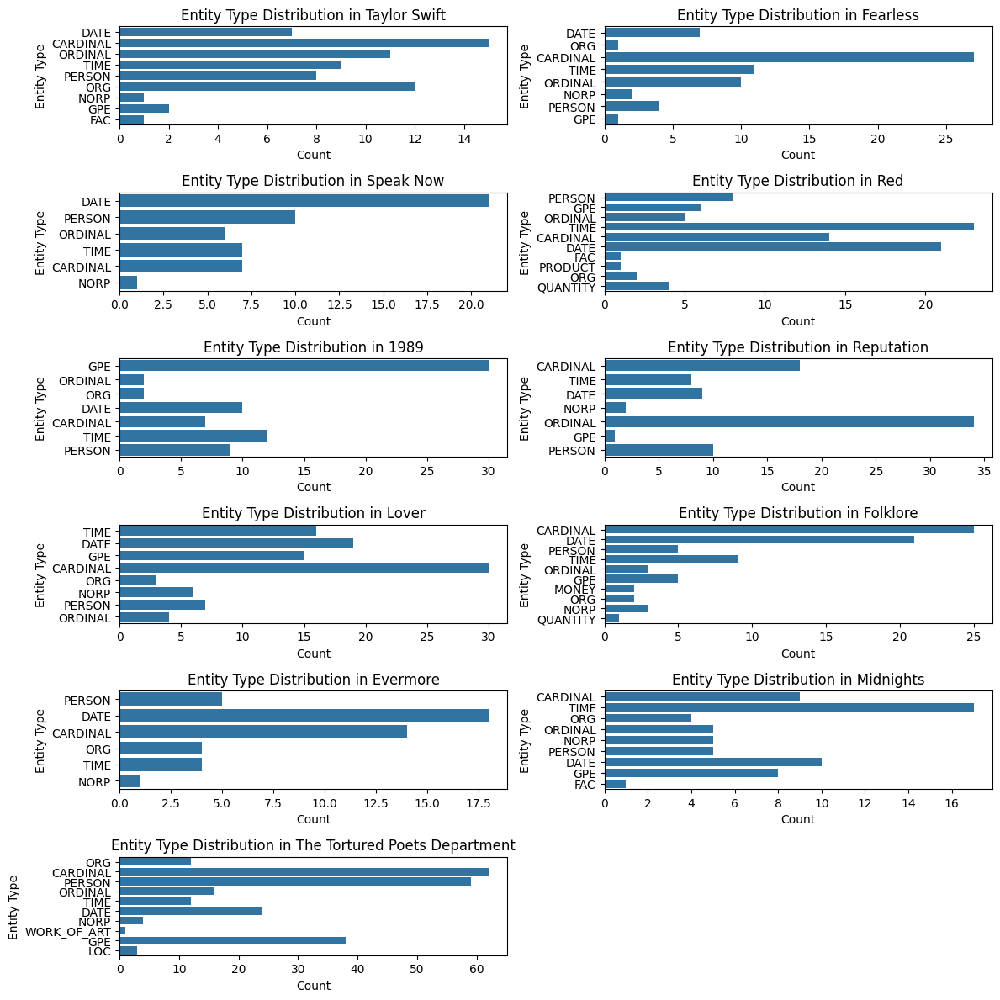

In [44]:
def plot_entity_distribution(entity_links):
    """Visualize the distribution of entity types across albums.

    Parameters:
    - entity_links (dict): A dictionary where keys are entities and values contain information about their co-occurrence.

    This function aggregates the named entities extracted from each song's lyrics, counts the occurrences of each entity type per album,
    and visualizes the distribution of entity types in a barplot for each album.
    """

    album_entities = {}
    for song_title, song_info in songs_data.items():
        album = song_info['album']
        entities = extract_entities(song_info['lyrics'])
        if album not in album_entities:
            album_entities[album] = []
        album_entities[album].extend(entities)

    # Count the occurrences of each entity type for each album
    entity_type_counts = {}
    for album, entities in album_entities.items():
        entity_type_counts[album] = {}
        for entity, entity_type in entities:
            if entity_type not in entity_type_counts[album]:
                entity_type_counts[album][entity_type] = 0
            entity_type_counts[album][entity_type] += 1

    # Plotting the distribution of entity types across albums
    plt.figure(figsize=(12, 12))
    for i, (album, counts) in enumerate(entity_type_counts.items()):
        plt.subplot(len(entity_type_counts) // 2 + 1, 2, i + 1)
        sns.barplot(x=list(counts.values()), y=list(counts.keys()))
        plt.title(f"Entity Type Distribution in {album}")
        plt.xlabel("Count")
        plt.ylabel("Entity Type")

    plt.tight_layout()
    plt.show()

# Example call to the function
plot_entity_distribution(entity_links)


## **Chatbot**

Sentiment Distribution:
Positive: 131 songs (69.31%)
Negative: 42 songs (22.22%)
Neutral: 16 songs (8.47%)


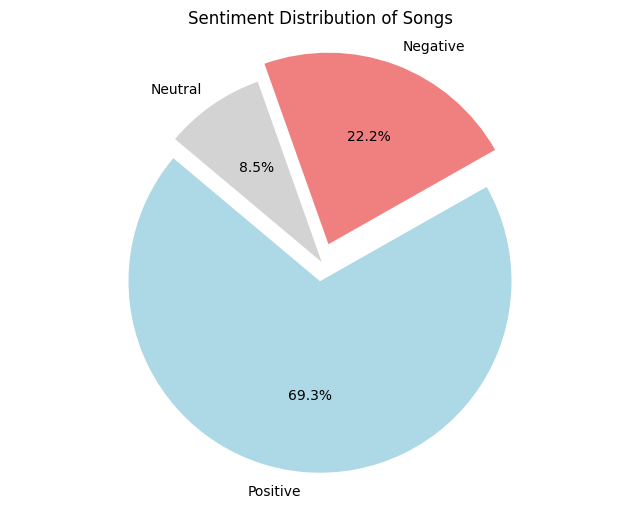

In [45]:
# Define thresholds as constants
POSITIVE_THRESHOLD = 0.7
NEGATIVE_THRESHOLD = -0.7

def recommend_songs_advanced(
    song_title,
    num_recommendations=10,
    album_filter=None,
    sentiment_filter=None,
    theme_keywords=None
):
    """
    Recommend songs based on lyric similarity with advanced filtering options.

    Parameters:
    - song_title (str): The title of the song to base recommendations on.
    - num_recommendations (int): The number of song recommendations to return (default is 10).
    - album_filter (str, optional): Filter recommendations by album name.
    - sentiment_filter (str, optional): Filter recommendations based on sentiment ('positive', 'negative', 'neutral').
    - theme_keywords (str, optional): Comma-separated string of keywords to filter by theme.

    Returns:
    - recommended_songs (list): A list of tuples, where each tuple contains the recommended song title and its similarity score.
    """
    normalized_input = normalize_song_title(song_title)
    print(f"Normalized input: {normalized_input}")  # Debugging output

    if normalized_input not in songs_data:
        print(f"Song '{normalized_input}' not found in data.")  # Debugging output
        return None

    # Initialize the TfidfVectorizer
    vectorizer = TfidfVectorizer(stop_words='english')
    song_lyrics = [song_info['lyrics'] for song_info in songs_data.values()]
    tfidf_matrix = vectorizer.fit_transform(song_lyrics)
    cosine_sim = cosine_similarity(tfidf_matrix, tfidf_matrix)

    # Get index of the input song and similarity scores
    song_idx = list(songs_data.keys()).index(normalized_input)
    sim_scores = list(enumerate(cosine_sim[song_idx]))

    # Filter by theme keywords (if provided)
    if theme_keywords:
        theme_keywords = [kw.strip().lower() for kw in theme_keywords.split(',')]
        print(f"Theme keywords: {theme_keywords}")  # Debugging output

        regex_patterns = [fr'\b{re.escape(kw)}\b' for kw in theme_keywords]
        matching_indices = [
            idx for idx, song in enumerate(songs_data.values())
            if any(re.search(pattern, song['lyrics'].lower()) for pattern in regex_patterns)
        ]
        sim_scores = [score for score in sim_scores if score[0] in matching_indices]

    # Apply album filter (if provided)
    if album_filter:
        filtered_indices = [
            idx for idx, title in enumerate(songs_data.keys())
            if songs_data[title]['album'].lower() == album_filter.lower()
        ]
        sim_scores = [score for score in sim_scores if score[0] in filtered_indices]

    # Apply sentiment filter (if provided)
    if sentiment_filter:
        sim_scores = [
            score for score in sim_scores
            if (
                sentiment_filter == 'positive' and songs_data[list(songs_data.keys())[score[0]]]['sentiment']['Polarity'] > POSITIVE_THRESHOLD
            ) or (
                sentiment_filter == 'negative' and songs_data[list(songs_data.keys())[score[0]]]['sentiment']['Polarity'] < NEGATIVE_THRESHOLD
            ) or (
                sentiment_filter == 'neutral' and NEGATIVE_THRESHOLD <= songs_data[list(songs_data.keys())[score[0]]]['sentiment']['Polarity'] <= POSITIVE_THRESHOLD
            )
        ]

    # Sort by similarity score and get top recommendations
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    top_songs = sim_scores[1:num_recommendations + 1]
    recommended_songs = [(list(songs_data.keys())[i], score) for i, score in top_songs]

    return recommended_songs

def analyze_sentiment_distribution():
    """
    Analyze and display the sentiment distribution (positive, negative, neutral) of songs.

    This function calculates the number of positive, negative, and neutral songs based on sentiment polarity.
    It also visualizes the sentiment distribution using a pie chart.
    """
    # Extract polarity values
    polarity_values = [song['sentiment']['Polarity'] for song in songs_data.values()]

    # Categorize songs
    positive_count = sum(1 for p in polarity_values if p > POSITIVE_THRESHOLD)
    negative_count = sum(1 for p in polarity_values if p < NEGATIVE_THRESHOLD)
    neutral_count = len(polarity_values) - (positive_count + negative_count)

    # Calculate percentages
    total_songs = len(polarity_values)
    positive_ratio = positive_count / total_songs * 100
    negative_ratio = negative_count / total_songs * 100
    neutral_ratio = neutral_count / total_songs * 100

    # Display results
    print(f"Sentiment Distribution:")
    print(f"Positive: {positive_count} songs ({positive_ratio:.2f}%)")
    print(f"Negative: {negative_count} songs ({negative_ratio:.2f}%)")
    print(f"Neutral: {neutral_count} songs ({neutral_ratio:.2f}%)")

    # Visualize the distribution
    labels = ['Positive', 'Negative', 'Neutral']
    sizes = [positive_count, negative_count, neutral_count]
    colors = ['lightblue', 'lightcoral', 'lightgrey']
    explode = (0.1, 0.1, 0)  # Highlight positive and negative

    plt.figure(figsize=(8, 6))
    plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
    plt.title('Sentiment Distribution of Songs')
    plt.axis('equal')  # Equal aspect ratio ensures pie is drawn as a circle.
    plt.show()

# Run the analysis
analyze_sentiment_distribution()


In [46]:
def find_song(user_input, songs_data):
    """
    Find an exact match for the song title in the songs dataset.

    Parameters:
    - user_input (str): The song title entered by the user.
    - songs_data (dict): The dictionary containing song titles and their respective data.

    Returns:
    - str or None: The song title if an exact match is found, otherwise None.
    """
    if user_input in songs_data:
        return user_input
    return None

def suggest_song(user_input, songs_data):
    """
    Suggest a song using fuzzy matching when an exact match is not found.

    Parameters:
    - user_input (str): The song title entered by the user.
    - songs_data (dict): The dictionary containing song titles and their respective data.

    Returns:
    - str or None: The closest matching song title if the match is above a confidence threshold, otherwise None.
    """
    song_titles = list(songs_data.keys())
    closest_match = process.extractOne(user_input, song_titles)
    if closest_match and closest_match[1] > 80:  # Confidence threshold
        return closest_match[0]
    return None

def chatbot_advanced():
    """
    A chatbot for personalized song recommendations based on user input.
    This bot provides song recommendations using various filters such as sentiment, album, and themes.

    The flow of the chatbot is as follows:
    1. User inputs a song title.
    2. If an exact match is found, it proceeds. If not, fuzzy matching is attempted.
    3. User can choose between receiving a single song recommendation or a playlist.
    4. User can apply filters such as album name, sentiment, or keywords/themes to narrow down recommendations.
    5. The chatbot suggests top recommendations and provides an option to explore more or exit.
    """
    print("🎤 Welcome to the Advanced Swiftie Lyric Bot! 🎶")
    print("Looking for personalized song recommendations? Let's get started!")
    print("✨ Type the name of a Taylor Swift song, and I'll recommend others.")
    print("🎧 Add filters like album, sentiment, or themes for a tailored experience.")
    print("Type 'exit' anytime to leave. 💃\n")

    while True:
        # Get user input for song title
        user_input = input("🎵 Your song choice (or type 'exit'): ").strip()
        if user_input.lower() == 'exit':
            print("🌟 Thanks for chatting! 'You’ve got no reason to be afraid, you're on your own, kid🫶🏽")
            break

        # Try to find an exact match
        matched_song = find_song(user_input, songs_data)
        if not matched_song:
            suggested_song = suggest_song(user_input, songs_data)
            if suggested_song:
                response = input(f"😔 Couldn't find '{user_input}'. Did you mean '{suggested_song}'? (yes/no or type 'exit'): ").strip().lower()
                if response == 'exit':
                    print("🌟 Thanks for chatting! 'You’ve got no reason to be afraid, you're on your own, kid🫶🏽")
                    break
                if response == 'yes':
                    matched_song = suggested_song
                else:
                    continue
            else:
                print(f"😔 Oops! I couldn't find '{user_input}'. Try another song.")
                continue

        print(f"🎶 Found your song: {matched_song}")

        # Ask for playlist or single song with validation
        while True:
            playlist_or_single = input("📋 Do you want a single song recommendation or a playlist? (Type 'single', 'playlist', or 'exit'): ").strip().lower()
            if playlist_or_single == 'exit':
                print("🌟 Thanks for chatting! 'You’ve got no reason to be afraid, you're on your own, kid🫶🏽")
                return
            if playlist_or_single in ['single', 'playlist']:
                break
            else:
                print("⚠️ Invalid input. Please type 'single' or 'playlist'.")

        # Set the number of recommendations based on user choice
        num_recommendations = 1 if playlist_or_single == 'single' else 10

        # Get optional filters
        album_filter = input("🎤 Want to filter by album? Type the album name or press Enter to skip (or type 'exit'): ").strip()
        if album_filter.lower() == 'exit':
            print("🌟 Thanks for chatting! 'You’ve got no reason to be afraid, you're on your own, kid🫶🏽")
            break
        album_filter = album_filter or None

        # Ask for sentiment preference with validation
        while True:
            sentiment_filter = input("🎭 Sentiment preference (positive/negative/neutral)? Press Enter to skip or type 'exit': ").strip().lower()
            if sentiment_filter == 'exit':
                print("🌟 Thanks for chatting! 'You’ve got no reason to be afraid, you're on your own, kid🫶🏽")
                return
            if sentiment_filter in ['positive', 'negative', 'neutral', '']:
                break
            else:
                print("⚠️ Invalid input. Please type 'positive', 'negative', 'neutral', or press Enter to skip.")

        theme_keywords = input("🌟 Key themes or keywords to match? Separate by commas or press Enter to skip (or type 'exit'): ").strip()
        if theme_keywords.lower() == 'exit':
            print("🌟 Thanks for chatting! 'You’ve got no reason to be afraid, you're on your own, kid🫶🏽")
            break
        theme_keywords = theme_keywords or None

        # Recommend songs
        recommendations = recommend_songs_advanced(
            song_title=matched_song,
            num_recommendations=num_recommendations,
            album_filter=album_filter,
            sentiment_filter=sentiment_filter if sentiment_filter else None,
            theme_keywords=theme_keywords
        )

        if not recommendations:
            print("😔 No recommendations found with the specified filters. This could be because:\n"
                  "1. **Sentiment**: The selected sentiment might not match any songs.\n"
                  "2. **Combination of filters**: The combination of album, sentiment, or theme filters may be too narrow.\n"
                  "Try adjusting the filters or removing some of them for broader results!")
        else:
            print(f"\n🎶 Here are your top recommendations for '{matched_song}':")
            for idx, (rec_song, score) in enumerate(recommendations, 1):
                print(f"{idx}. {rec_song} (Similarity: {score:.2f})")
        print("\n")


In [47]:
# Run the chatbot_advanced()
chatbot_advanced()

🎤 Welcome to the Advanced Swiftie Lyric Bot! 🎶
Looking for personalized song recommendations? Let's get started!
✨ Type the name of a Taylor Swift song, and I'll recommend others.
🎧 Add filters like album, sentiment, or themes for a tailored experience.
Type 'exit' anytime to leave. 💃

🎵 Your song choice (or type 'exit'): Love Story
🎶 Found your song: Love Story
📋 Do you want a single song recommendation or a playlist? (Type 'single', 'playlist', or 'exit'): playlist
🎤 Want to filter by album? Type the album name or press Enter to skip (or type 'exit'): Fearless
🎭 Sentiment preference (positive/negative/neutral)? Press Enter to skip or type 'exit': positive
🌟 Key themes or keywords to match? Separate by commas or press Enter to skip (or type 'exit'): love, fairytale
Normalized input: Love Story
Theme keywords: ['love', 'fairytale']

🎶 Here are your top recommendations for 'Love Story':
1. The Best Day (Similarity: 0.10)
2. White Horse (Similarity: 0.09)
3. The Way Iloved You (Similarit